In [13]:
from __future__ import print_function
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tqdm import tqdm_notebook as tqdm
import numpy as np
import os
import time
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
from torch.autograd import Variable
from torch import nn, optim
import torch.nn.functional as F
from torchvision import datasets, transforms
from torchvision.utils import save_image

There are 20579 pictures of dogs.


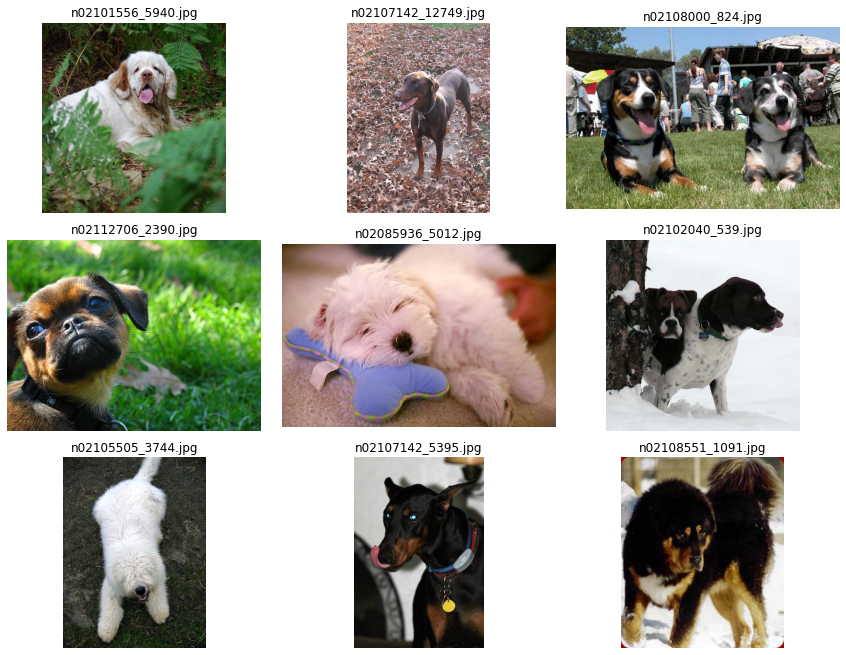

In [14]:
PATH = '/home/nick/Downloads/all-dogs/'
images = os.listdir(PATH)
print(f'There are {len(os.listdir(PATH))} pictures of dogs.')

fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(12,10))

for indx, axis in enumerate(axes.flatten()):
    rnd_indx = np.random.randint(0, len(os.listdir(PATH)))
    # https://matplotlib.org/users/image_tutorial.html
    img = plt.imread(PATH + images[rnd_indx])
    imgplot = axis.imshow(img)
    axis.set_title(images[rnd_indx])
    axis.set_axis_off()
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

In [26]:
batch_size = 32
batchSize = 64
imageSize = 64

# 64x64 images!
transform = transforms.Compose([transforms.Resize(64),
                                transforms.CenterCrop(64),
                                transforms.ToTensor(),
                                transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

train_data = datasets.ImageFolder('/home/nick/Downloads/all-dogs/', transform=transform)

dataloader = torch.utils.data.DataLoader(train_data, shuffle=True,
                                           batch_size=batch_size)

imgs, label = next(iter(dataloader))
imgs = imgs.numpy().transpose(0, 2, 3, 1)

In [27]:
batch_size = 32
image_size = 64

random_transforms = [transforms.ColorJitter(), transforms.RandomRotation(degrees=20)]
transform = transforms.Compose([transforms.Resize(64),
                                transforms.CenterCrop(64),
                                transforms.RandomHorizontalFlip(p=0.5),
                                transforms.RandomApply(random_transforms, p=0.2),
                                transforms.ToTensor(),
                                transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

train_data = datasets.ImageFolder('/home/nick/Downloads/all-dogs/', transform=transform)
train_loader = torch.utils.data.DataLoader(train_data, shuffle=True,
                                           batch_size=batch_size)
                                           
imgs, label = next(iter(train_loader))
imgs = imgs.numpy().transpose(0, 2, 3, 1)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


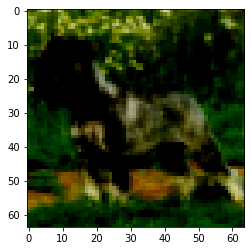

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


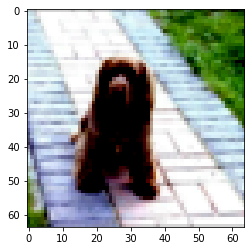

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


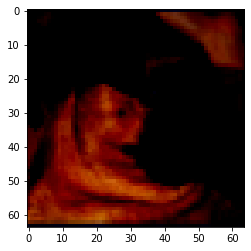

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


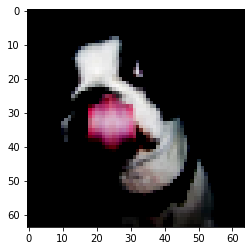

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


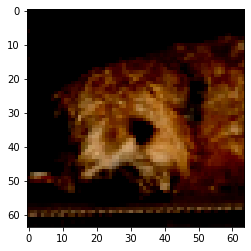

In [28]:
for i in range(5):
    plt.imshow(imgs[i])
    plt.show()

In [29]:
def weights_init(m):
    """
    Takes as input a neural network m that will initialize all its weights.
    """
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)

In [30]:
class G(nn.Module):
    def __init__(self):
        # Used to inherit the torch.nn Module
        super(G, self).__init__()
        # Meta Module - consists of different layers of Modules
        self.main = nn.Sequential(
                nn.ConvTranspose2d(100, 512, 4, stride=1, padding=0, bias=False),
                nn.BatchNorm2d(512),
                nn.ReLU(True),
                nn.ConvTranspose2d(512, 256, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(256),
                nn.ReLU(True),
                nn.ConvTranspose2d(256, 128, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(128),
                nn.ReLU(True),
                nn.ConvTranspose2d(128, 64, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(64),
                nn.ReLU(True),
                nn.ConvTranspose2d(64, 3, 4, stride=2, padding=1, bias=False),
                nn.Tanh()
                )
        
    def forward(self, input):
        output = self.main(input)
        return output

# Creating the generator
netG = G()
netG.apply(weights_init)

G(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)

In [31]:
class D(nn.Module):
    def __init__(self):
        super(D, self).__init__()
        self.main = nn.Sequential(
                nn.Conv2d(3, 64, 4, stride=2, padding=1, bias=False),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(64, 128, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(128),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(128, 256, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(256),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(256, 512, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(512),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(512, 1, 4, stride=1, padding=0, bias=False),
                nn.Sigmoid()
                )
        
    def forward(self, input):
        output = self.main(input)
        # .view(-1) = Flattens the output into 1D instead of 2D
        return output.view(-1)
    
    
# Creating the discriminator
netD = D()
netD.apply(weights_init)

D(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)

In [32]:
class Generator(nn.Module):
    def __init__(self, nz=128, channels=3):
        super(Generator, self).__init__()
        
        self.nz = nz
        self.channels = channels
        
        def convlayer(n_input, n_output, k_size=4, stride=2, padding=0):
            block = [
                nn.ConvTranspose2d(n_input, n_output, kernel_size=k_size, stride=stride, padding=padding, bias=False),
                nn.BatchNorm2d(n_output),
                nn.ReLU(inplace=True),
            ]
            return block

        self.model = nn.Sequential(
            *convlayer(self.nz, 1024, 4, 1, 0), # Fully connected layer via convolution.
            *convlayer(1024, 512, 4, 2, 1),
            *convlayer(512, 256, 4, 2, 1),
            *convlayer(256, 128, 4, 2, 1),
            *convlayer(128, 64, 4, 2, 1),
            nn.ConvTranspose2d(64, self.channels, 3, 1, 1),
            nn.Tanh()
        )

    def forward(self, z):
        z = z.view(-1, self.nz, 1, 1)
        img = self.model(z)
        return img

    
class Discriminator(nn.Module):
    def __init__(self, channels=3):
        super(Discriminator, self).__init__()
        
        self.channels = channels

        def convlayer(n_input, n_output, k_size=4, stride=2, padding=0, bn=False):
            block = [nn.Conv2d(n_input, n_output, kernel_size=k_size, stride=stride, padding=padding, bias=False)]
            if bn:
                block.append(nn.BatchNorm2d(n_output))
            block.append(nn.LeakyReLU(0.2, inplace=True))
            return block

        self.model = nn.Sequential(
            *convlayer(self.channels, 32, 4, 2, 1),
            *convlayer(32, 64, 4, 2, 1),
            *convlayer(64, 128, 4, 2, 1, bn=True),
            *convlayer(128, 256, 4, 2, 1, bn=True),
            nn.Conv2d(256, 1, 4, 1, 0, bias=False),  # FC with Conv.
        )

    def forward(self, imgs):
        logits = self.model(imgs)
        out = torch.sigmoid(logits)
    
        return out.view(-1, 1)

In [33]:
!mkdir results
!ls

image.py  results  Untitled.ipynb


In [36]:
EPOCH = 1 # play with me
LR = 0.001
criterion = nn.BCELoss()
optimizerD = optim.Adam(netD.parameters(), lr=LR, betas=(0.5, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=LR, betas=(0.5, 0.999))

In [37]:
for epoch in range(EPOCH):
    for i, data in enumerate(dataloader, 0):
        # 1st Step: Updating the weights of the neural network of the discriminator
        netD.zero_grad()
        
        # Training the discriminator with a real image of the dataset
        real,_ = data
        input = Variable(real)
        target = Variable(torch.ones(input.size()[0]))
        output = netD(input)
        errD_real = criterion(output, target)
        
        # Training the discriminator with a fake image generated by the generator
        noise = Variable(torch.randn(input.size()[0], 100, 1, 1))
        fake = netG(noise)
        target = Variable(torch.zeros(input.size()[0]))
        output = netD(fake.detach())
        errD_fake = criterion(output, target)
        
        # Backpropagating the total error
        errD = errD_real + errD_fake
        errD.backward()
        optimizerD.step()
        
        # 2nd Step: Updating the weights of the neural network of the generator
        netG.zero_grad()
        target = Variable(torch.ones(input.size()[0]))
        output = netD(fake)
        errG = criterion(output, target)
        errG.backward()
        optimizerG.step()
        
        # 3rd Step: Printing the losses and saving the real images and the generated images of the minibatch every 100 steps
        print('[%d/%d][%d/%d] Loss_D: %.4f; Loss_G: %.4f' % (epoch, EPOCH, i, len(dataloader), errD.item(), errG.item()))
        if i % 100 == 0:
            vutils.save_image(real, '%s/real_samples.png' % "./results", normalize=True)
            fake = netG(noise)
            vutils.save_image(fake.data, '%s/fake_samples_epoch_%03d.png' % ("./results", epoch), normalize=True)

[0/100][0/2] Loss_D: 1.4710; Loss_G: 27.0346
[0/100][1/2] Loss_D: 2.6208; Loss_G: 53.2758
[1/100][0/2] Loss_D: 2.0807; Loss_G: 19.7013
[1/100][1/2] Loss_D: 8.7607; Loss_G: 44.6220
[2/100][0/2] Loss_D: 0.2433; Loss_G: 28.3976
[2/100][1/2] Loss_D: 0.2138; Loss_G: 9.7550
[3/100][0/2] Loss_D: 26.5003; Loss_G: 32.5192
[3/100][1/2] Loss_D: 0.0040; Loss_G: 33.3285
[4/100][0/2] Loss_D: 2.7477; Loss_G: 32.7311
[4/100][1/2] Loss_D: 0.0231; Loss_G: 28.2493
[5/100][0/2] Loss_D: 0.0916; Loss_G: 17.2070
[5/100][1/2] Loss_D: 100.0000; Loss_G: 0.0000
[6/100][0/2] Loss_D: 59.0575; Loss_G: 23.6265
[6/100][1/2] Loss_D: 0.0020; Loss_G: 26.9100
[7/100][0/2] Loss_D: 0.7958; Loss_G: 25.0734
[7/100][1/2] Loss_D: 0.0549; Loss_G: 20.3431
[8/100][0/2] Loss_D: 2.1225; Loss_G: 32.3374
[8/100][1/2] Loss_D: 0.8169; Loss_G: 36.2316
[9/100][0/2] Loss_D: 1.0310; Loss_G: 29.5792
[9/100][1/2] Loss_D: 0.0005; Loss_G: 13.6756
[10/100][0/2] Loss_D: 5.0062; Loss_G: 23.5865
[10/100][1/2] Loss_D: 0.0078; Loss_G: 25.9817
[11/10

[91/100][0/2] Loss_D: 0.7038; Loss_G: 5.4632
[91/100][1/2] Loss_D: 0.0134; Loss_G: 4.5988
[92/100][0/2] Loss_D: 3.8869; Loss_G: 5.5548
[92/100][1/2] Loss_D: 0.0097; Loss_G: 12.0639
[93/100][0/2] Loss_D: 0.5298; Loss_G: 4.6626
[93/100][1/2] Loss_D: 0.0674; Loss_G: 5.9276
[94/100][0/2] Loss_D: 0.5812; Loss_G: 5.9591
[94/100][1/2] Loss_D: 0.1411; Loss_G: 10.5362
[95/100][0/2] Loss_D: 2.0608; Loss_G: 11.4486
[95/100][1/2] Loss_D: 0.9829; Loss_G: 16.2438
[96/100][0/2] Loss_D: 2.9155; Loss_G: 5.3673
[96/100][1/2] Loss_D: 5.2487; Loss_G: 21.0355
[97/100][0/2] Loss_D: 2.5348; Loss_G: 10.4868
[97/100][1/2] Loss_D: 2.2707; Loss_G: 6.1915
[98/100][0/2] Loss_D: 0.5801; Loss_G: 3.3845
[98/100][1/2] Loss_D: 0.2219; Loss_G: 5.1843
[99/100][0/2] Loss_D: 3.1562; Loss_G: 5.4892
[99/100][1/2] Loss_D: 0.4488; Loss_G: 10.4602


In [38]:
batch_size = 32
LR_G = 0.001
LR_D = 0.0005

beta1 = 0.5
epochs = 100

real_label = 0.9
fake_label = 0
nz = 128

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [39]:
netG = Generator(nz).to(device)
netD = Discriminator().to(device)

criterion = nn.BCELoss()

optimizerD = optim.Adam(netD.parameters(), lr=LR_D, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=LR_G, betas=(beta1, 0.999))

fixed_noise = torch.randn(25, nz, 1, 1, device=device)

G_losses = []
D_losses = []
epoch_time = []

In [40]:
def plot_loss (G_losses, D_losses, epoch):
    plt.figure(figsize=(10,5))
    plt.title("Generator and Discriminator Loss - EPOCH "+ str(epoch))
    plt.plot(G_losses,label="G")
    plt.plot(D_losses,label="D")
    plt.xlabel("iterations")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

In [41]:
def show_generated_img(n_images=5):
    sample = []
    for _ in range(n_images):
        noise = torch.randn(1, nz, 1, 1, device=device)
        gen_image = netG(noise).to("cpu").clone().detach().squeeze(0)
        gen_image = gen_image.numpy().transpose(1, 2, 0)
        sample.append(gen_image)
    
    figure, axes = plt.subplots(1, len(sample), figsize = (64,64))
    for index, axis in enumerate(axes):
        axis.axis('off')
        image_array = sample[index]
        axis.imshow(image_array)
        
    plt.show()
    plt.close()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

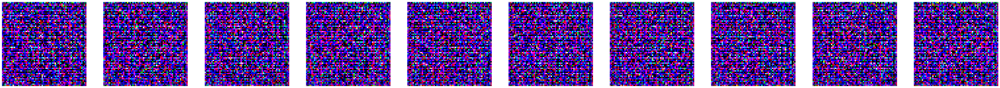

In [44]:
show_generated_img(10)

[1/100][322/644] Loss_D: 1.0000 Loss_G: 1.6004 D(x): 0.5039 D(G(z)): 0.2346 / 0.1968
[1/100][644/644] Loss_D: 2.2026 Loss_G: 1.9089 D(x): 0.1715 D(G(z)): 0.4440 / 0.1455



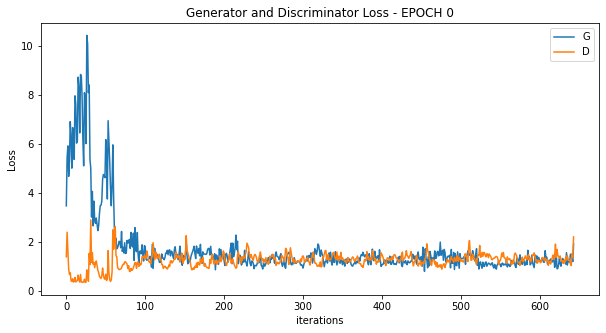

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


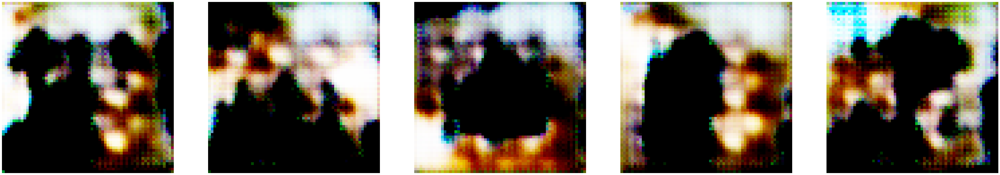

[2/100][322/644] Loss_D: 1.0107 Loss_G: 1.5618 D(x): 0.6048 D(G(z)): 0.3349 / 0.2095
[2/100][644/644] Loss_D: 2.4933 Loss_G: 2.3803 D(x): 0.2661 D(G(z)): 0.5836 / 0.0732



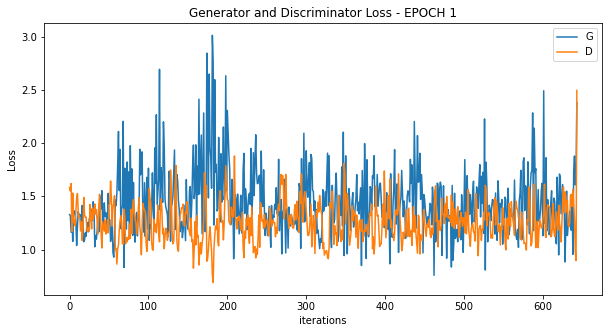

[3/100][322/644] Loss_D: 0.9913 Loss_G: 1.3952 D(x): 0.5786 D(G(z)): 0.3135 / 0.2277
[3/100][644/644] Loss_D: 1.6721 Loss_G: 2.5103 D(x): 0.4067 D(G(z)): 0.5176 / 0.0787



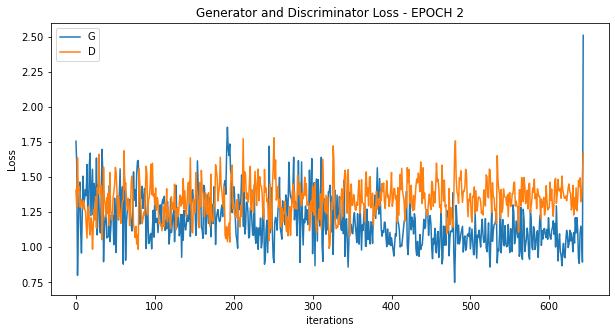

[4/100][322/644] Loss_D: 1.2384 Loss_G: 1.1229 D(x): 0.5424 D(G(z)): 0.4177 / 0.3171
[4/100][644/644] Loss_D: 1.7659 Loss_G: 1.3884 D(x): 0.2405 D(G(z)): 0.2181 / 0.2392



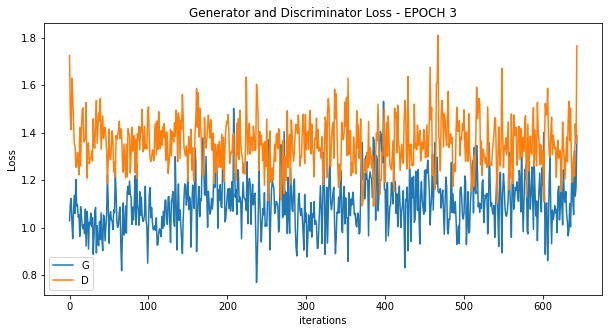

[5/100][322/644] Loss_D: 1.4670 Loss_G: 1.1664 D(x): 0.4350 D(G(z)): 0.4593 / 0.3088
[5/100][644/644] Loss_D: 1.3660 Loss_G: 1.5072 D(x): 0.3422 D(G(z)): 0.2631 / 0.1973



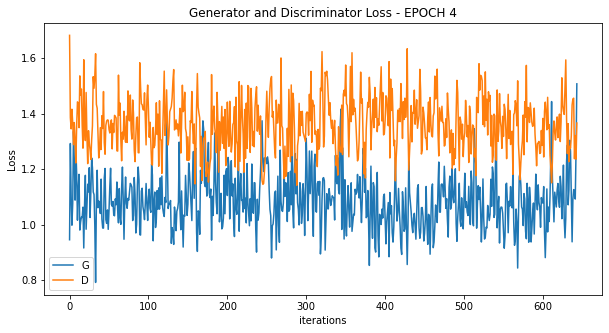

[6/100][322/644] Loss_D: 1.4852 Loss_G: 0.9233 D(x): 0.4076 D(G(z)): 0.4253 / 0.3900
[6/100][644/644] Loss_D: 1.3852 Loss_G: 1.1951 D(x): 0.2895 D(G(z)): 0.1891 / 0.2836



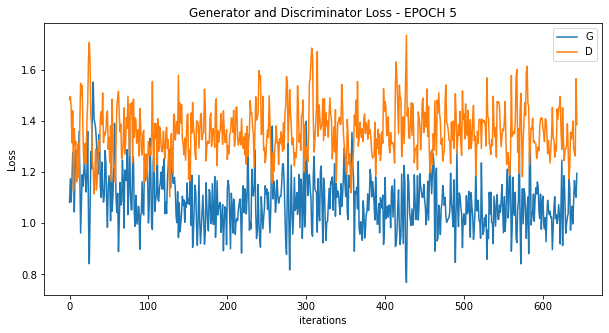

[7/100][322/644] Loss_D: 1.4344 Loss_G: 0.9148 D(x): 0.4399 D(G(z)): 0.4472 / 0.3907
[7/100][644/644] Loss_D: 1.7485 Loss_G: 1.4640 D(x): 0.2538 D(G(z)): 0.3719 / 0.2089



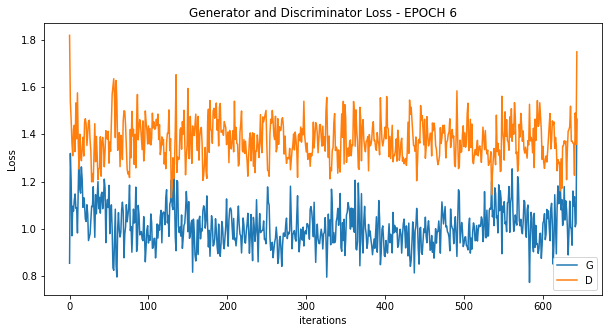

[8/100][322/644] Loss_D: 1.4162 Loss_G: 1.0408 D(x): 0.4094 D(G(z)): 0.4036 / 0.3421
[8/100][644/644] Loss_D: 1.2328 Loss_G: 1.4007 D(x): 0.3950 D(G(z)): 0.2851 / 0.2213



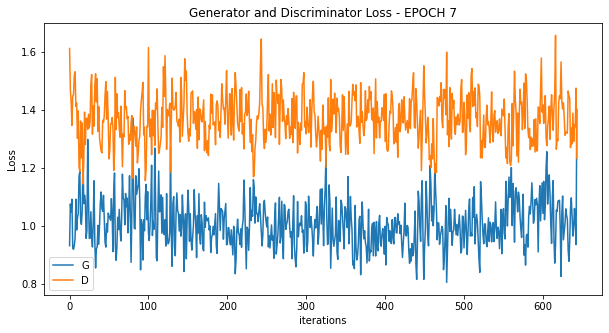

[9/100][322/644] Loss_D: 1.3661 Loss_G: 0.9092 D(x): 0.4557 D(G(z)): 0.4358 / 0.3932
[9/100][644/644] Loss_D: 1.2258 Loss_G: 1.7929 D(x): 0.4303 D(G(z)): 0.3113 / 0.1432



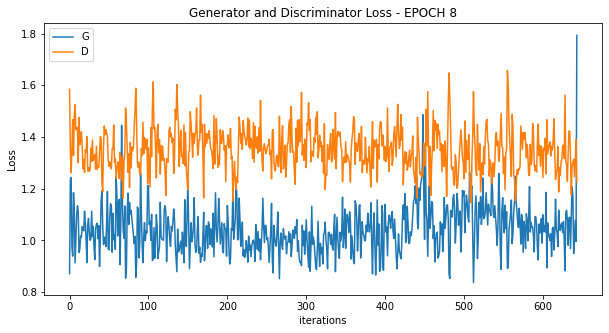

[10/100][322/644] Loss_D: 1.4887 Loss_G: 0.9415 D(x): 0.4402 D(G(z)): 0.4773 / 0.3799
[10/100][644/644] Loss_D: 1.3270 Loss_G: 2.3095 D(x): 0.5143 D(G(z)): 0.4772 / 0.0933



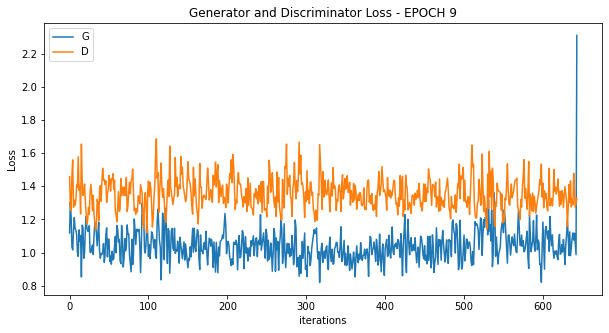

[11/100][322/644] Loss_D: 1.0708 Loss_G: 1.2797 D(x): 0.5712 D(G(z)): 0.3656 / 0.2567
[11/100][644/644] Loss_D: 1.2745 Loss_G: 1.5985 D(x): 0.4340 D(G(z)): 0.3431 / 0.1795



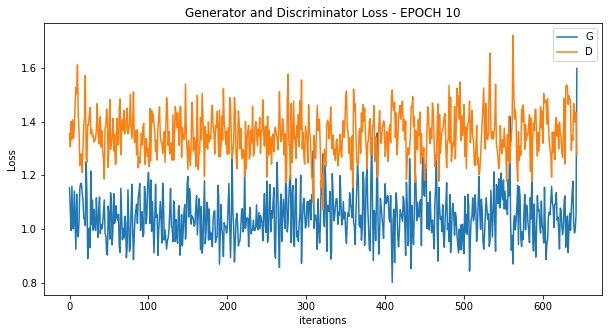

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


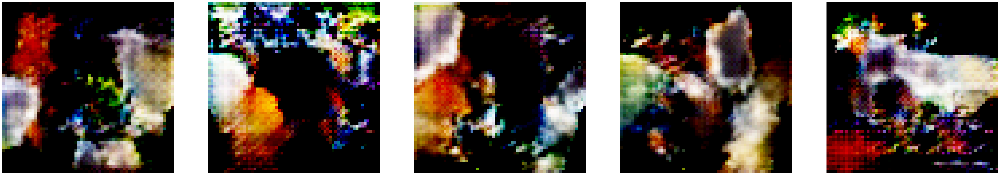

[12/100][322/644] Loss_D: 1.3210 Loss_G: 1.0784 D(x): 0.4696 D(G(z)): 0.4165 / 0.3230
[12/100][644/644] Loss_D: 2.0812 Loss_G: 1.3844 D(x): 0.2448 D(G(z)): 0.5167 / 0.2874



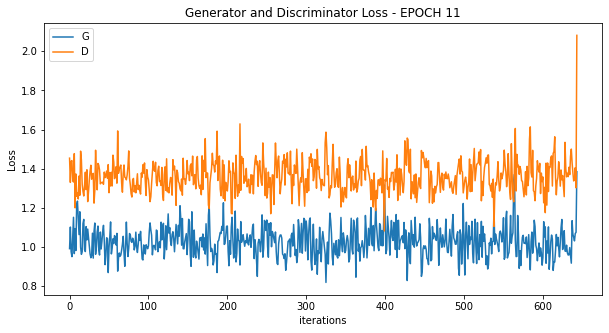

[13/100][322/644] Loss_D: 1.2357 Loss_G: 1.1799 D(x): 0.5239 D(G(z)): 0.4189 / 0.2896
[13/100][644/644] Loss_D: 1.2819 Loss_G: 1.5793 D(x): 0.4540 D(G(z)): 0.3817 / 0.1781



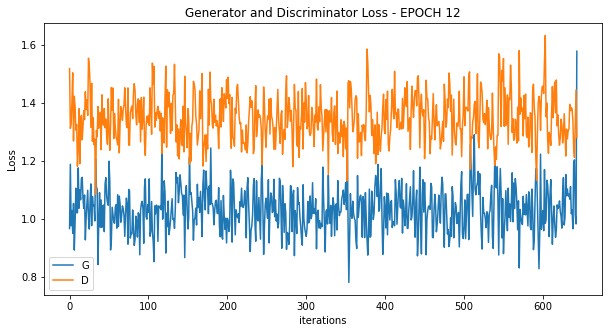

[14/100][322/644] Loss_D: 1.2097 Loss_G: 1.0966 D(x): 0.5147 D(G(z)): 0.4001 / 0.3186
[14/100][644/644] Loss_D: 1.2217 Loss_G: 1.6342 D(x): 0.4754 D(G(z)): 0.3543 / 0.1681



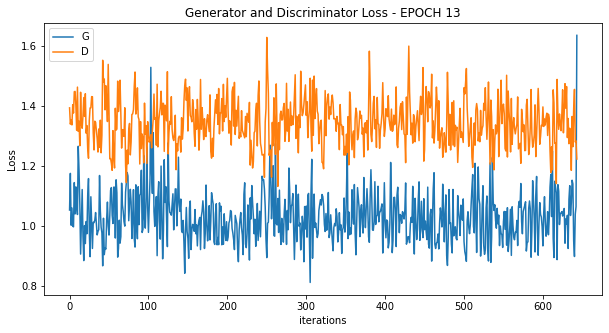

[15/100][322/644] Loss_D: 1.2618 Loss_G: 1.1536 D(x): 0.4730 D(G(z)): 0.3762 / 0.2998
[15/100][644/644] Loss_D: 1.5940 Loss_G: 2.0955 D(x): 0.2972 D(G(z)): 0.3438 / 0.1022



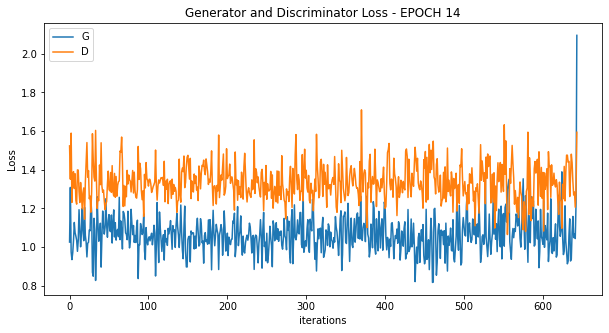

[16/100][322/644] Loss_D: 1.3160 Loss_G: 0.9820 D(x): 0.4982 D(G(z)): 0.4355 / 0.3657
[16/100][644/644] Loss_D: 1.4065 Loss_G: 2.0352 D(x): 0.4437 D(G(z)): 0.4414 / 0.1073



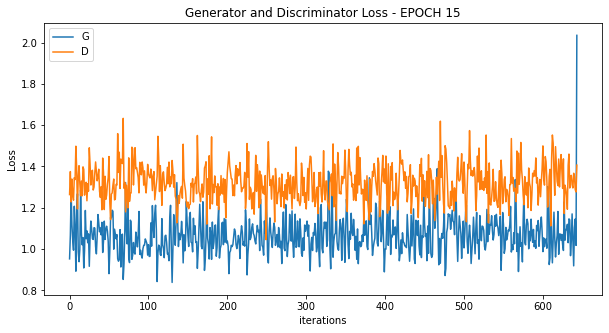

[17/100][322/644] Loss_D: 1.2499 Loss_G: 1.1761 D(x): 0.4548 D(G(z)): 0.3425 / 0.2935
[17/100][644/644] Loss_D: 1.2253 Loss_G: 1.9232 D(x): 0.4308 D(G(z)): 0.3192 / 0.1208



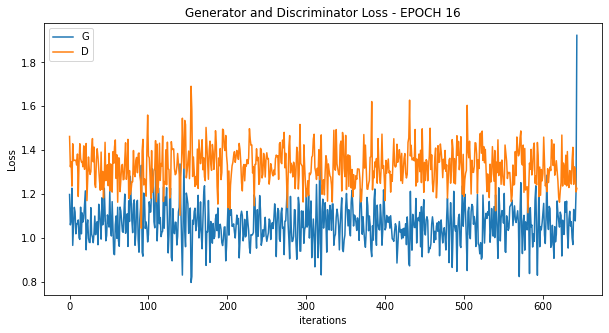

[18/100][322/644] Loss_D: 1.2225 Loss_G: 1.1588 D(x): 0.5004 D(G(z)): 0.3850 / 0.3006
[18/100][644/644] Loss_D: 1.5250 Loss_G: 1.3906 D(x): 0.3032 D(G(z)): 0.2816 / 0.2211



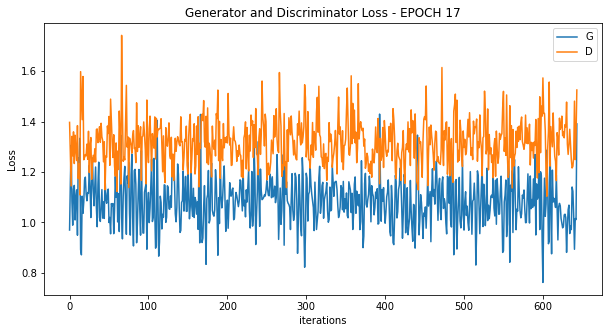

[19/100][322/644] Loss_D: 1.3518 Loss_G: 1.0814 D(x): 0.5110 D(G(z)): 0.4651 / 0.3229
[19/100][644/644] Loss_D: 1.3736 Loss_G: 1.8564 D(x): 0.3429 D(G(z)): 0.2706 / 0.1324



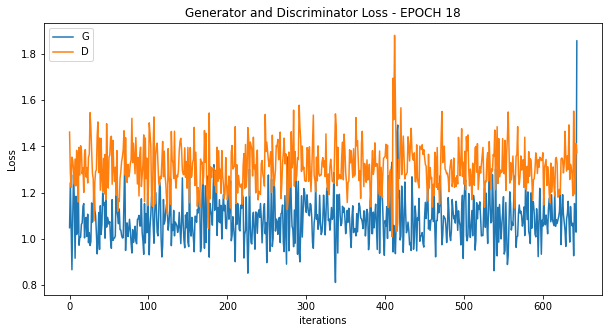

[20/100][322/644] Loss_D: 1.5262 Loss_G: 1.0890 D(x): 0.2844 D(G(z)): 0.2636 / 0.3246
[20/100][644/644] Loss_D: 1.7859 Loss_G: 2.2810 D(x): 0.3570 D(G(z)): 0.4303 / 0.0905



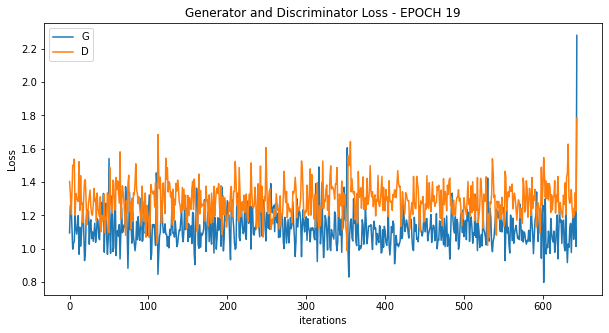

[21/100][322/644] Loss_D: 1.2584 Loss_G: 1.1630 D(x): 0.4846 D(G(z)): 0.3715 / 0.2991
[21/100][644/644] Loss_D: 1.2694 Loss_G: 1.4642 D(x): 0.3689 D(G(z)): 0.2414 / 0.2292



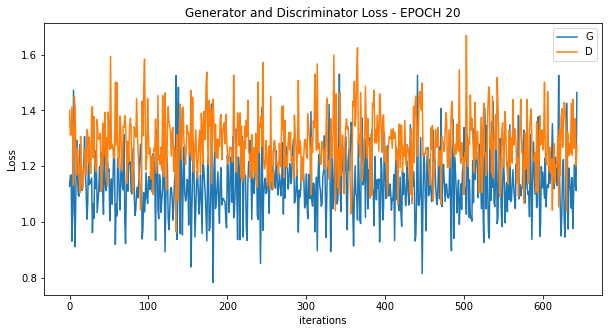

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


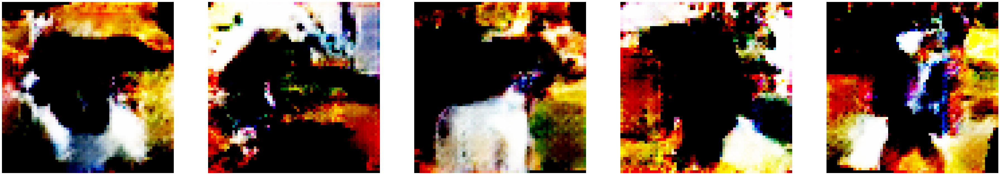

[22/100][322/644] Loss_D: 1.3177 Loss_G: 1.1498 D(x): 0.5274 D(G(z)): 0.4540 / 0.3105
[22/100][644/644] Loss_D: 1.5979 Loss_G: 1.8016 D(x): 0.2795 D(G(z)): 0.3230 / 0.1635



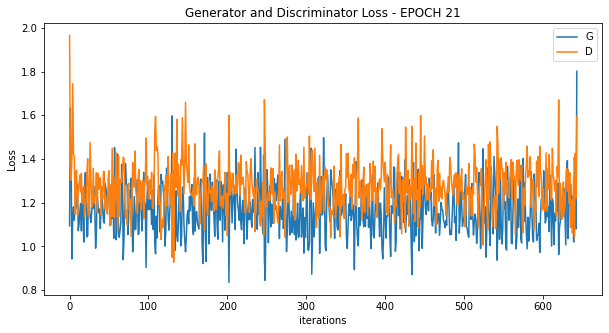

[23/100][322/644] Loss_D: 1.3130 Loss_G: 0.9238 D(x): 0.4989 D(G(z)): 0.4295 / 0.3920
[23/100][644/644] Loss_D: 0.7480 Loss_G: 2.8397 D(x): 0.7154 D(G(z)): 0.2600 / 0.0466



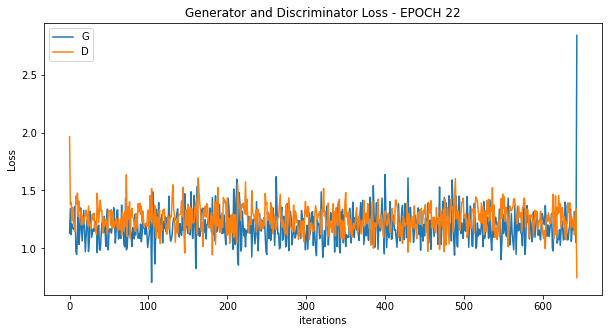

[24/100][322/644] Loss_D: 1.3098 Loss_G: 1.1630 D(x): 0.5707 D(G(z)): 0.4752 / 0.3030
[24/100][644/644] Loss_D: 1.5081 Loss_G: 1.5368 D(x): 0.2319 D(G(z)): 0.1494 / 0.2097



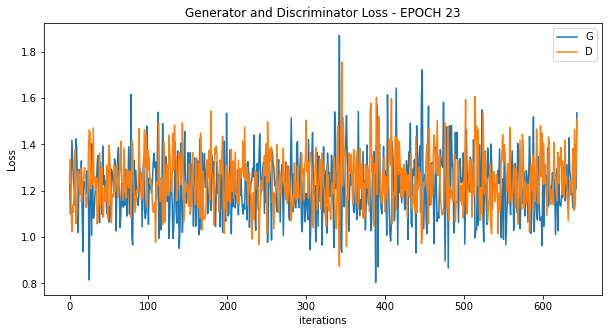

[25/100][322/644] Loss_D: 1.2302 Loss_G: 1.2095 D(x): 0.5752 D(G(z)): 0.4411 / 0.2855
[25/100][644/644] Loss_D: 1.4180 Loss_G: 2.7329 D(x): 0.3575 D(G(z)): 0.3521 / 0.0849



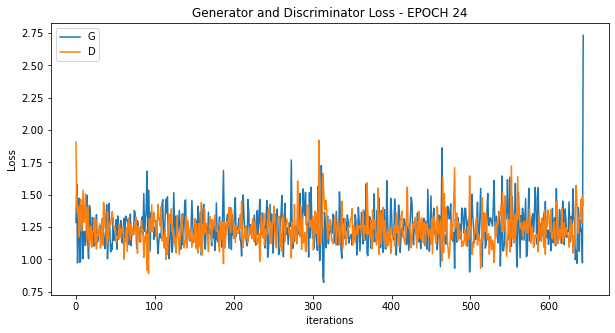

[26/100][322/644] Loss_D: 1.2987 Loss_G: 1.0833 D(x): 0.3759 D(G(z)): 0.2221 / 0.3314
[26/100][644/644] Loss_D: 1.5768 Loss_G: 2.2144 D(x): 0.3024 D(G(z)): 0.3324 / 0.0938



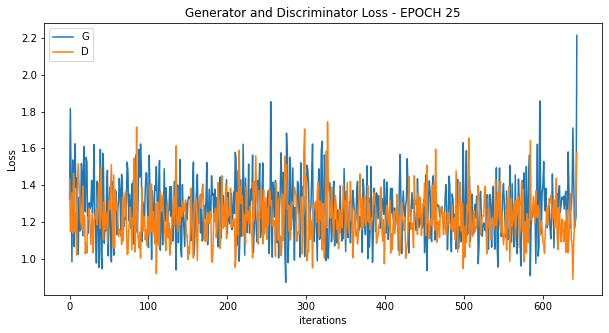

[27/100][322/644] Loss_D: 1.2940 Loss_G: 1.2396 D(x): 0.5649 D(G(z)): 0.4584 / 0.2728
[27/100][644/644] Loss_D: 0.6603 Loss_G: 2.3573 D(x): 0.6847 D(G(z)): 0.1652 / 0.0757



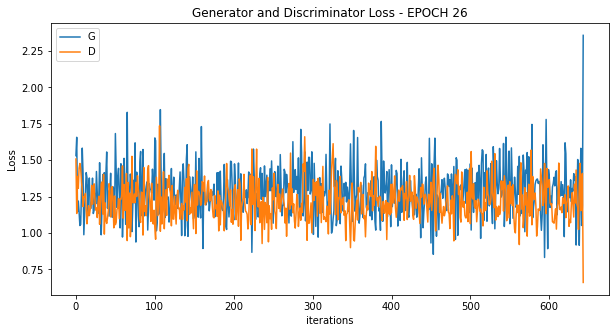

[28/100][322/644] Loss_D: 1.2111 Loss_G: 1.2185 D(x): 0.5795 D(G(z)): 0.4074 / 0.2889
[28/100][644/644] Loss_D: 1.1809 Loss_G: 2.4563 D(x): 0.4243 D(G(z)): 0.2494 / 0.0728



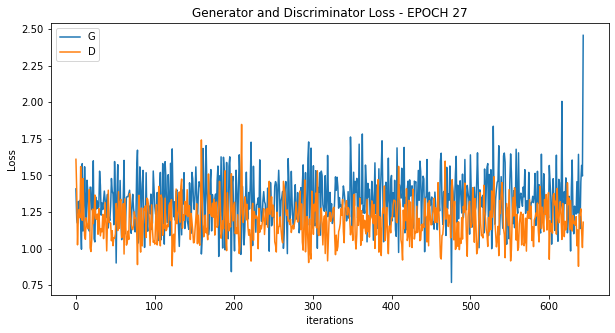

[29/100][322/644] Loss_D: 1.0567 Loss_G: 1.3562 D(x): 0.6077 D(G(z)): 0.3564 / 0.2485
[29/100][644/644] Loss_D: 1.2489 Loss_G: 2.4197 D(x): 0.3814 D(G(z)): 0.2454 / 0.0759



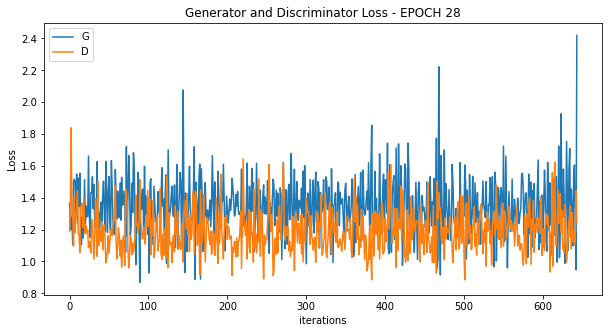

[30/100][322/644] Loss_D: 1.1946 Loss_G: 1.3109 D(x): 0.4462 D(G(z)): 0.2735 / 0.2738
[30/100][644/644] Loss_D: 1.3302 Loss_G: 2.4453 D(x): 0.3835 D(G(z)): 0.2529 / 0.0690



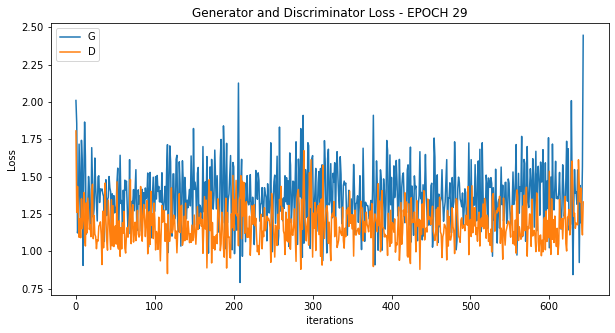

[31/100][322/644] Loss_D: 1.1033 Loss_G: 1.4006 D(x): 0.5837 D(G(z)): 0.3736 / 0.2352
[31/100][644/644] Loss_D: 0.9403 Loss_G: 3.2391 D(x): 0.5697 D(G(z)): 0.1974 / 0.0287



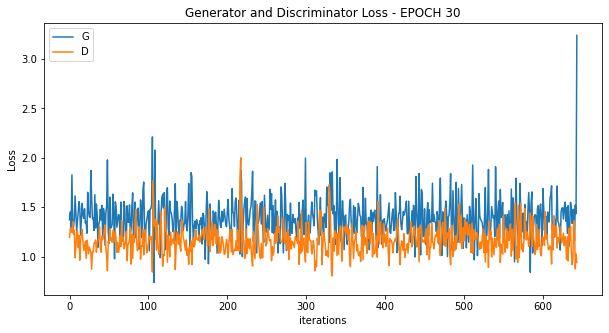

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


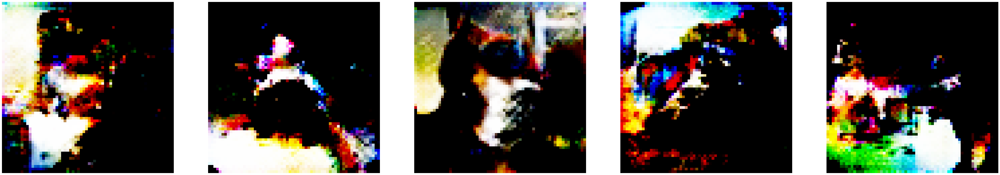

[32/100][322/644] Loss_D: 1.2599 Loss_G: 1.6229 D(x): 0.6610 D(G(z)): 0.4738 / 0.1899
[32/100][644/644] Loss_D: 1.0194 Loss_G: 2.8314 D(x): 0.5243 D(G(z)): 0.2522 / 0.0539



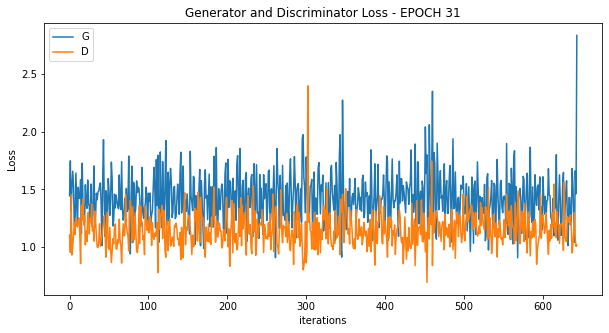

[33/100][322/644] Loss_D: 1.2494 Loss_G: 1.6208 D(x): 0.5348 D(G(z)): 0.3743 / 0.1978
[33/100][644/644] Loss_D: 1.2070 Loss_G: 1.8602 D(x): 0.3536 D(G(z)): 0.1915 / 0.1329



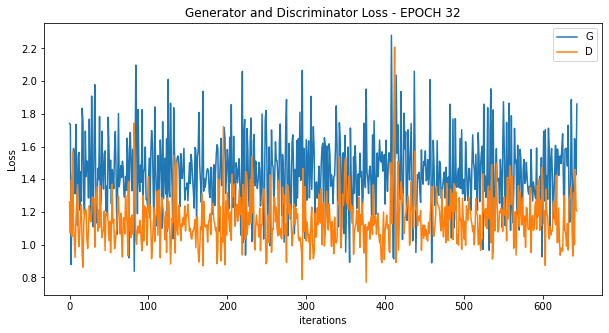

[34/100][322/644] Loss_D: 1.3224 Loss_G: 1.2283 D(x): 0.4871 D(G(z)): 0.3601 / 0.3091
[34/100][644/644] Loss_D: 1.3345 Loss_G: 3.9398 D(x): 0.5047 D(G(z)): 0.4386 / 0.0159



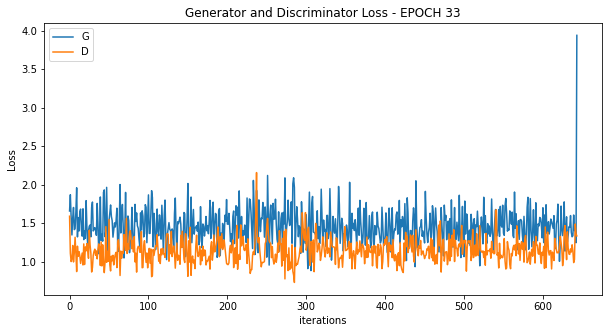

[35/100][322/644] Loss_D: 1.1661 Loss_G: 1.5143 D(x): 0.5580 D(G(z)): 0.3723 / 0.2162
[35/100][644/644] Loss_D: 0.6024 Loss_G: 2.8337 D(x): 0.7052 D(G(z)): 0.1269 / 0.0482



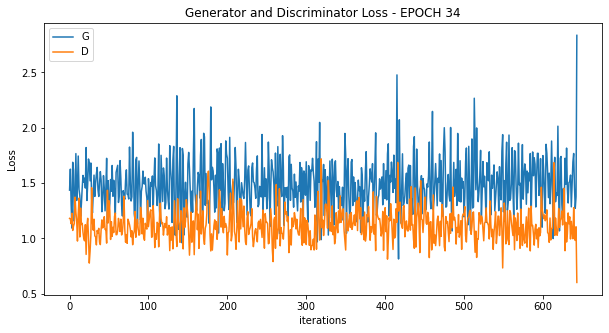

[36/100][322/644] Loss_D: 1.1619 Loss_G: 1.8390 D(x): 0.7435 D(G(z)): 0.4866 / 0.1500
[36/100][644/644] Loss_D: 1.2250 Loss_G: 3.0045 D(x): 0.4417 D(G(z)): 0.2883 / 0.0625



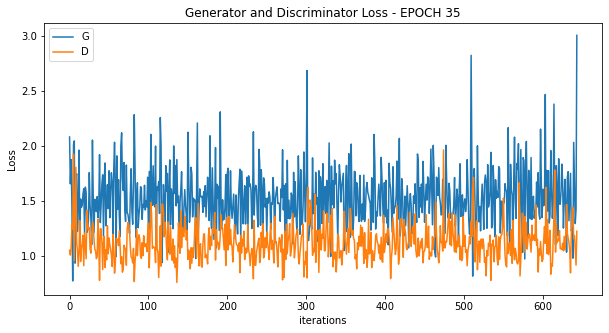

[37/100][322/644] Loss_D: 1.0938 Loss_G: 1.7084 D(x): 0.5826 D(G(z)): 0.3237 / 0.1848
[37/100][644/644] Loss_D: 1.1679 Loss_G: 2.1981 D(x): 0.3533 D(G(z)): 0.0905 / 0.0899



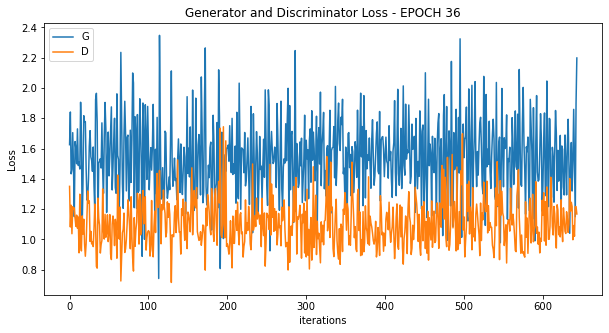

[38/100][322/644] Loss_D: 1.3639 Loss_G: 1.4514 D(x): 0.5053 D(G(z)): 0.3926 / 0.2469
[38/100][644/644] Loss_D: 0.6359 Loss_G: 2.7190 D(x): 0.6381 D(G(z)): 0.0655 / 0.0548



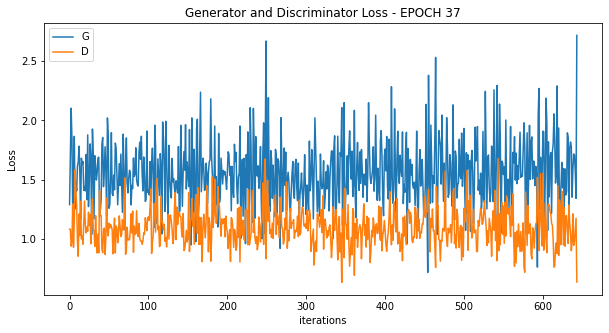

[39/100][322/644] Loss_D: 0.8803 Loss_G: 1.8150 D(x): 0.6388 D(G(z)): 0.2636 / 0.1593
[39/100][644/644] Loss_D: 1.4168 Loss_G: 1.7770 D(x): 0.3207 D(G(z)): 0.1669 / 0.2317



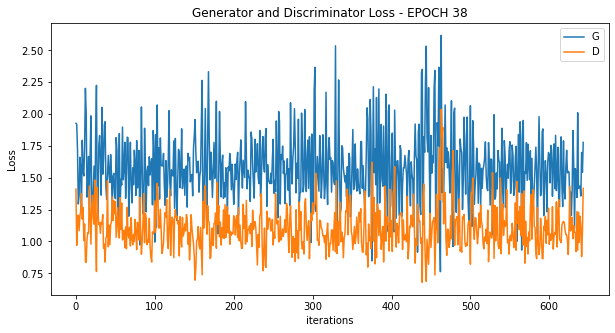

[40/100][322/644] Loss_D: 0.9394 Loss_G: 1.5874 D(x): 0.6565 D(G(z)): 0.3139 / 0.1892
[40/100][644/644] Loss_D: 1.6469 Loss_G: 3.1128 D(x): 0.2947 D(G(z)): 0.1551 / 0.0593



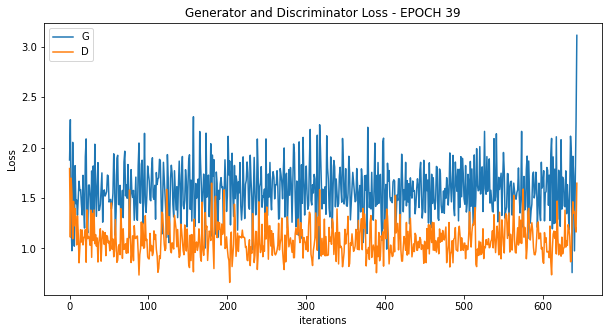

[41/100][322/644] Loss_D: 1.1363 Loss_G: 1.3943 D(x): 0.5518 D(G(z)): 0.3269 / 0.2587
[41/100][644/644] Loss_D: 1.2939 Loss_G: 3.5680 D(x): 0.3836 D(G(z)): 0.2357 / 0.0622



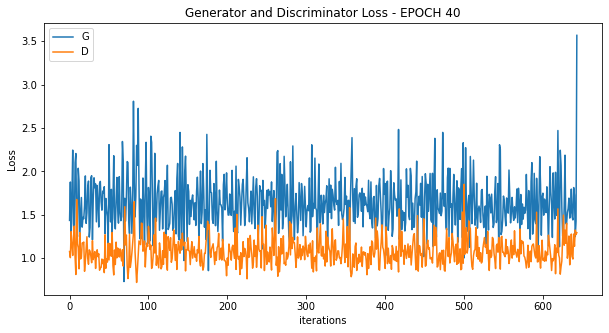

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


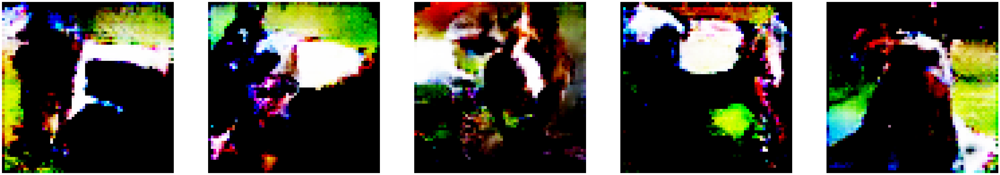

[42/100][322/644] Loss_D: 0.8840 Loss_G: 1.7688 D(x): 0.6048 D(G(z)): 0.2111 / 0.1698
[42/100][644/644] Loss_D: 0.4919 Loss_G: 4.7542 D(x): 0.8446 D(G(z)): 0.1295 / 0.0075



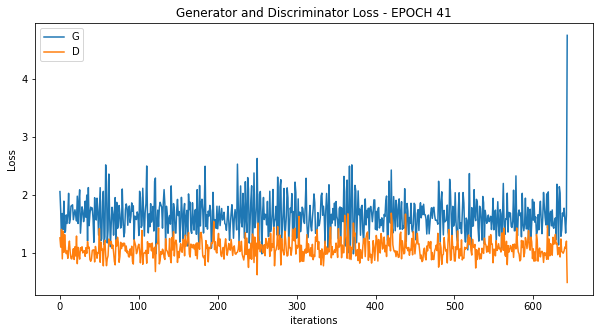

[43/100][322/644] Loss_D: 1.2484 Loss_G: 1.1930 D(x): 0.3809 D(G(z)): 0.1844 / 0.3191
[43/100][644/644] Loss_D: 2.3943 Loss_G: 1.6354 D(x): 0.1064 D(G(z)): 0.1708 / 0.1722



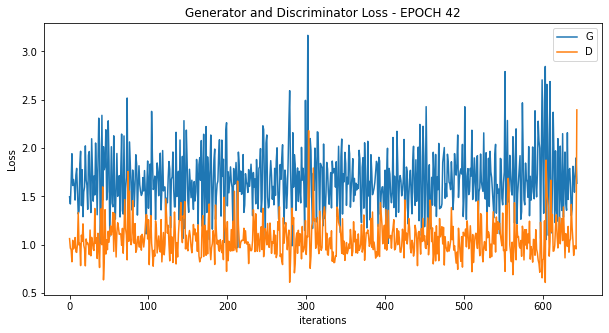

[44/100][322/644] Loss_D: 0.8655 Loss_G: 2.1138 D(x): 0.7093 D(G(z)): 0.2637 / 0.1132
[44/100][644/644] Loss_D: 1.4282 Loss_G: 2.9559 D(x): 0.3383 D(G(z)): 0.1954 / 0.0952



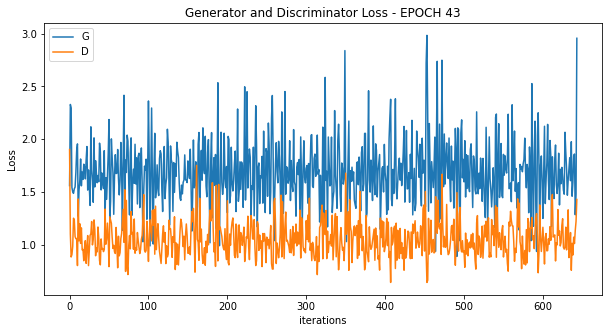

[45/100][322/644] Loss_D: 0.9805 Loss_G: 1.7159 D(x): 0.5928 D(G(z)): 0.2670 / 0.1860
[45/100][644/644] Loss_D: 0.7953 Loss_G: 4.6232 D(x): 0.6148 D(G(z)): 0.1796 / 0.0126



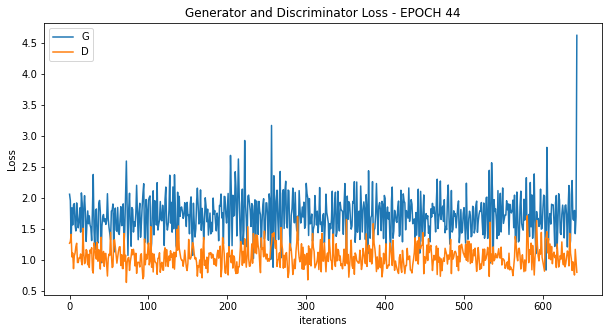

[46/100][322/644] Loss_D: 0.8918 Loss_G: 1.9483 D(x): 0.6612 D(G(z)): 0.2892 / 0.1476
[46/100][644/644] Loss_D: 0.8799 Loss_G: 6.3321 D(x): 0.7107 D(G(z)): 0.3449 / 0.0011



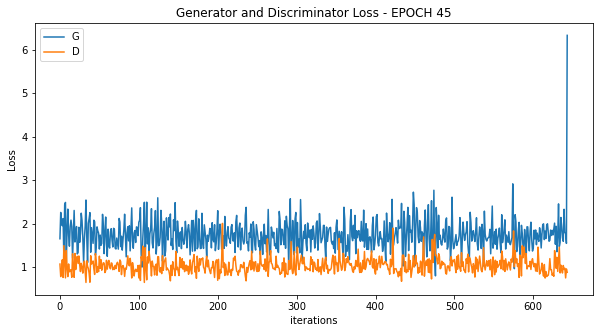

[47/100][322/644] Loss_D: 0.9259 Loss_G: 2.0628 D(x): 0.8173 D(G(z)): 0.3761 / 0.1275
[47/100][644/644] Loss_D: 0.4246 Loss_G: 3.7004 D(x): 0.8761 D(G(z)): 0.0436 / 0.0170



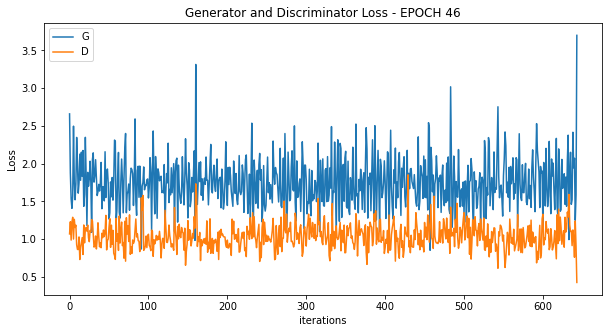

[48/100][322/644] Loss_D: 1.1434 Loss_G: 1.4927 D(x): 0.5392 D(G(z)): 0.3189 / 0.2229
[48/100][644/644] Loss_D: 0.9884 Loss_G: 5.4521 D(x): 0.6116 D(G(z)): 0.2597 / 0.0239



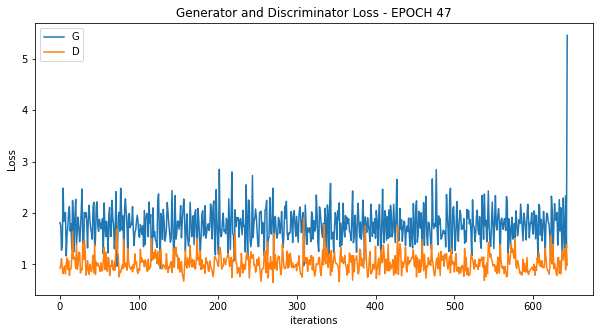

[49/100][322/644] Loss_D: 0.9780 Loss_G: 1.8791 D(x): 0.6097 D(G(z)): 0.2825 / 0.1507
[49/100][644/644] Loss_D: 1.1406 Loss_G: 4.0400 D(x): 0.4063 D(G(z)): 0.2302 / 0.0157



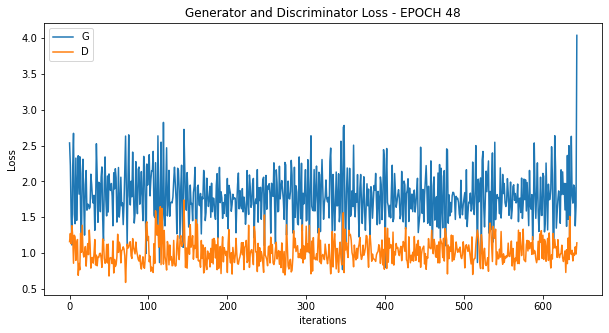

[50/100][322/644] Loss_D: 0.9240 Loss_G: 1.6284 D(x): 0.5746 D(G(z)): 0.2198 / 0.1958
[50/100][644/644] Loss_D: 0.5821 Loss_G: 3.6946 D(x): 0.7533 D(G(z)): 0.1246 / 0.0221



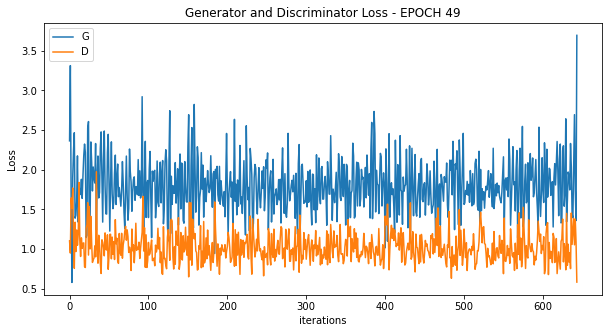

[51/100][322/644] Loss_D: 1.0488 Loss_G: 1.6152 D(x): 0.5804 D(G(z)): 0.2896 / 0.2034
[51/100][644/644] Loss_D: 0.6980 Loss_G: 2.3677 D(x): 0.5954 D(G(z)): 0.1123 / 0.0781



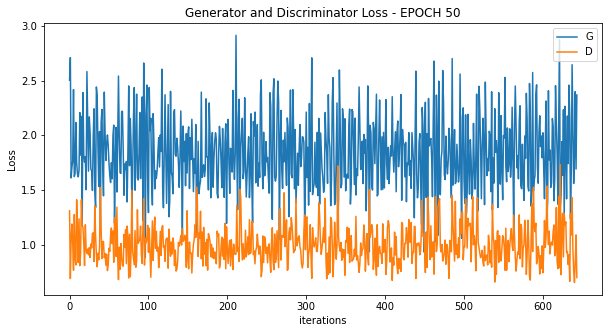

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


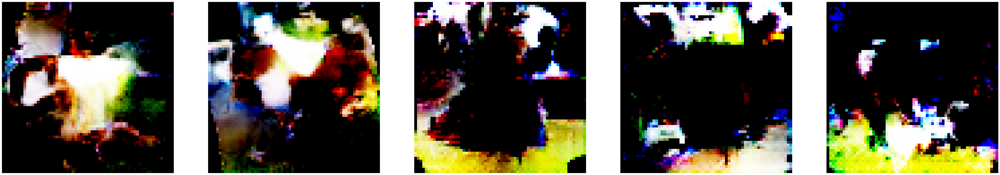

[52/100][322/644] Loss_D: 0.9280 Loss_G: 2.2382 D(x): 0.7298 D(G(z)): 0.3463 / 0.0980
[52/100][644/644] Loss_D: 1.3761 Loss_G: 5.0798 D(x): 0.4332 D(G(z)): 0.3173 / 0.0077



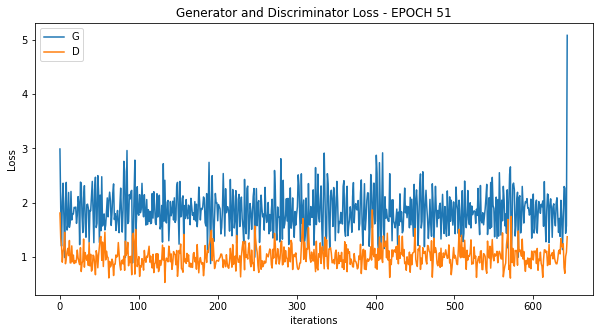

[53/100][322/644] Loss_D: 1.0980 Loss_G: 1.9906 D(x): 0.5824 D(G(z)): 0.3216 / 0.1344
[53/100][644/644] Loss_D: 1.1193 Loss_G: 3.7154 D(x): 0.4829 D(G(z)): 0.1453 / 0.0258



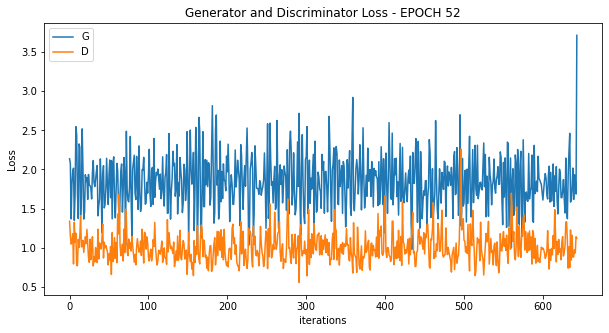

[54/100][322/644] Loss_D: 1.0815 Loss_G: 2.5656 D(x): 0.9460 D(G(z)): 0.4561 / 0.0713
[54/100][644/644] Loss_D: 0.6659 Loss_G: 6.5643 D(x): 0.9409 D(G(z)): 0.2496 / 0.0015



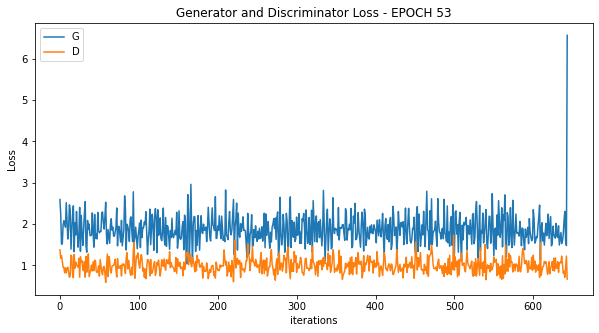

[55/100][322/644] Loss_D: 1.0718 Loss_G: 1.8306 D(x): 0.7651 D(G(z)): 0.4104 / 0.1744
[55/100][644/644] Loss_D: 0.6536 Loss_G: 3.4828 D(x): 0.6232 D(G(z)): 0.1155 / 0.0232



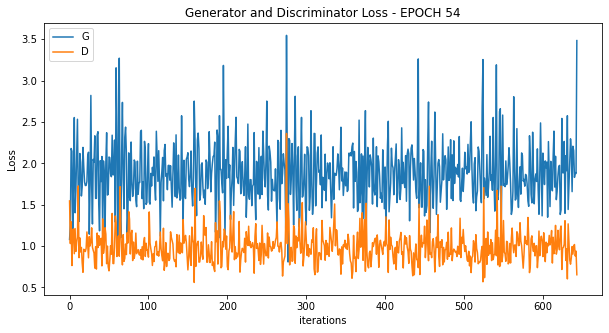

[56/100][322/644] Loss_D: 0.9978 Loss_G: 2.2411 D(x): 0.6728 D(G(z)): 0.3342 / 0.1081
[56/100][644/644] Loss_D: 0.9098 Loss_G: 4.0952 D(x): 0.4827 D(G(z)): 0.1438 / 0.0175



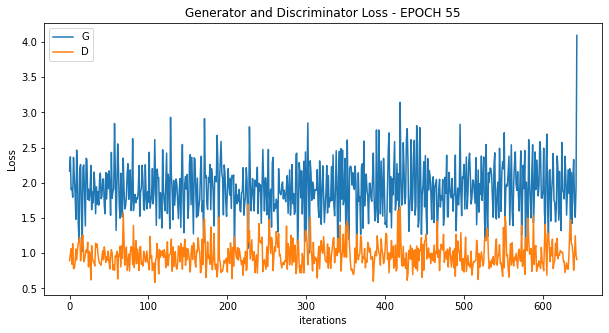

[57/100][322/644] Loss_D: 0.9780 Loss_G: 1.7378 D(x): 0.6313 D(G(z)): 0.2862 / 0.1812
[57/100][644/644] Loss_D: 3.1376 Loss_G: 5.7797 D(x): 0.0687 D(G(z)): 0.4820 / 0.0082



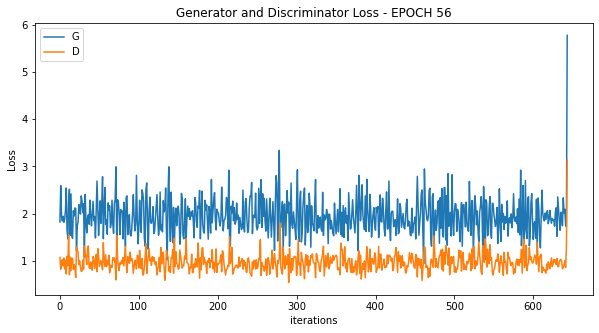

[58/100][322/644] Loss_D: 0.9846 Loss_G: 1.6049 D(x): 0.5521 D(G(z)): 0.2145 / 0.2144
[58/100][644/644] Loss_D: 0.6418 Loss_G: 6.2131 D(x): 0.9435 D(G(z)): 0.1891 / 0.0031



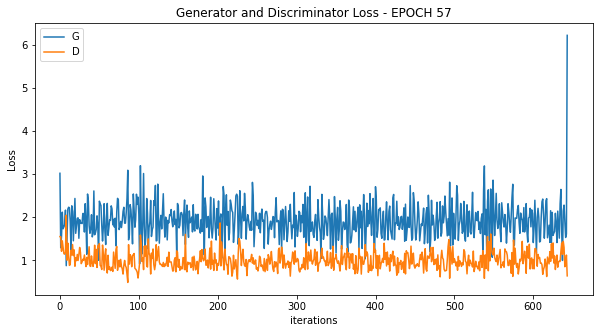

[59/100][322/644] Loss_D: 0.8544 Loss_G: 1.8192 D(x): 0.6504 D(G(z)): 0.2322 / 0.1761
[59/100][644/644] Loss_D: 0.5981 Loss_G: 3.4141 D(x): 0.6451 D(G(z)): 0.0358 / 0.0259



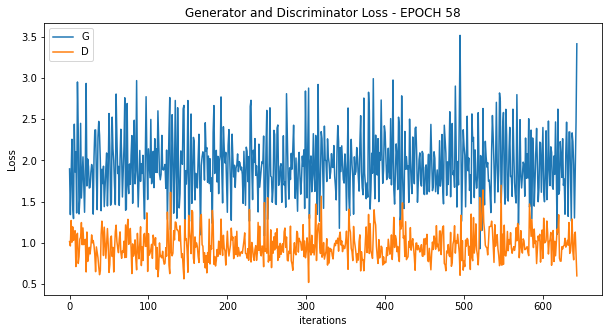

[60/100][322/644] Loss_D: 0.7634 Loss_G: 1.7762 D(x): 0.6789 D(G(z)): 0.1864 / 0.1861
[60/100][644/644] Loss_D: 0.6545 Loss_G: 4.7102 D(x): 0.7925 D(G(z)): 0.2295 / 0.0055



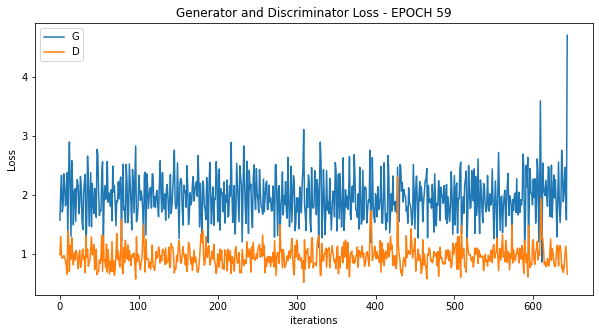

[61/100][322/644] Loss_D: 1.1959 Loss_G: 1.4182 D(x): 0.4952 D(G(z)): 0.2880 / 0.2377
[61/100][644/644] Loss_D: 0.6626 Loss_G: 6.0426 D(x): 0.9687 D(G(z)): 0.1421 / 0.0025



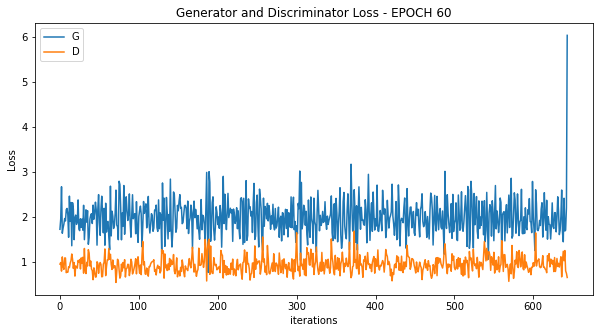

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


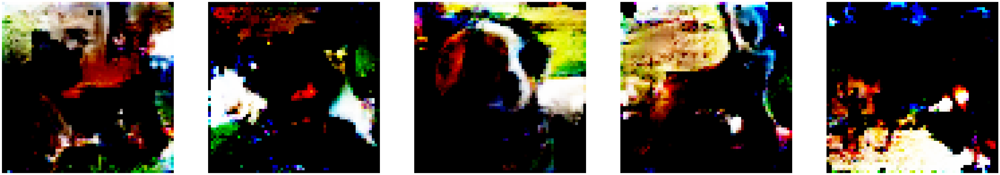

[62/100][322/644] Loss_D: 0.9128 Loss_G: 2.3155 D(x): 0.6899 D(G(z)): 0.3145 / 0.0984
[62/100][644/644] Loss_D: 2.3395 Loss_G: 1.8023 D(x): 0.1092 D(G(z)): 0.0732 / 0.1573



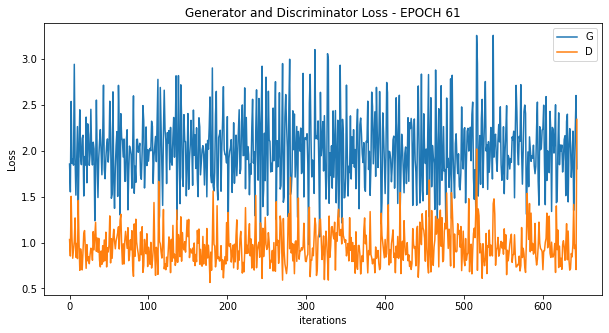

[63/100][322/644] Loss_D: 1.3366 Loss_G: 2.6540 D(x): 0.8498 D(G(z)): 0.5457 / 0.0689
[63/100][644/644] Loss_D: 1.3041 Loss_G: 2.2153 D(x): 0.3880 D(G(z)): 0.0303 / 0.1161



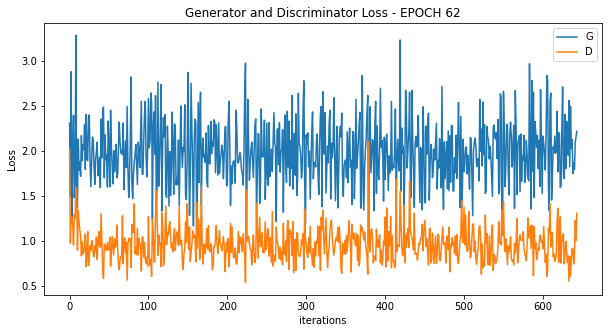

[64/100][322/644] Loss_D: 0.7984 Loss_G: 2.0924 D(x): 0.6529 D(G(z)): 0.1955 / 0.1301
[64/100][644/644] Loss_D: 0.8693 Loss_G: 3.0843 D(x): 0.5020 D(G(z)): 0.0701 / 0.0362



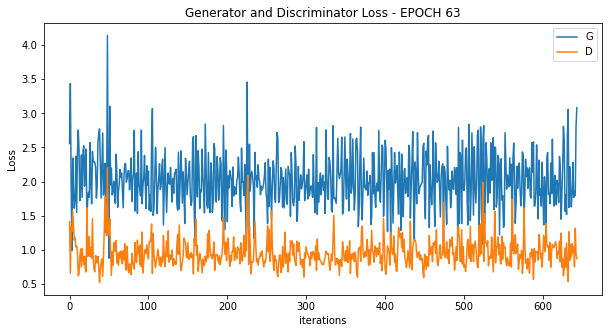

[65/100][322/644] Loss_D: 1.0052 Loss_G: 2.1473 D(x): 0.7173 D(G(z)): 0.3684 / 0.1208
[65/100][644/644] Loss_D: 0.7327 Loss_G: 5.5473 D(x): 0.7891 D(G(z)): 0.2386 / 0.0061



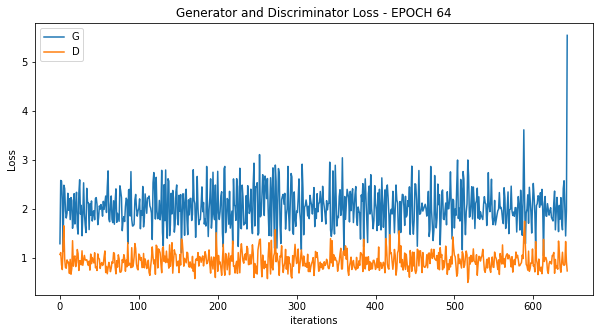

[66/100][322/644] Loss_D: 0.8806 Loss_G: 2.1505 D(x): 0.8524 D(G(z)): 0.3433 / 0.1173
[66/100][644/644] Loss_D: 0.5817 Loss_G: 4.6211 D(x): 0.8476 D(G(z)): 0.1888 / 0.0072



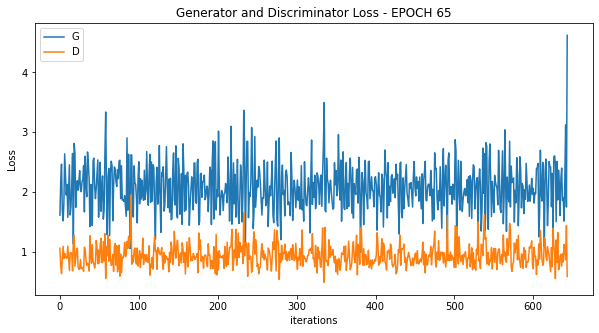

[67/100][322/644] Loss_D: 0.8428 Loss_G: 2.1020 D(x): 0.6247 D(G(z)): 0.2147 / 0.1290
[67/100][644/644] Loss_D: 0.4161 Loss_G: 4.2970 D(x): 0.7786 D(G(z)): 0.0372 / 0.0140



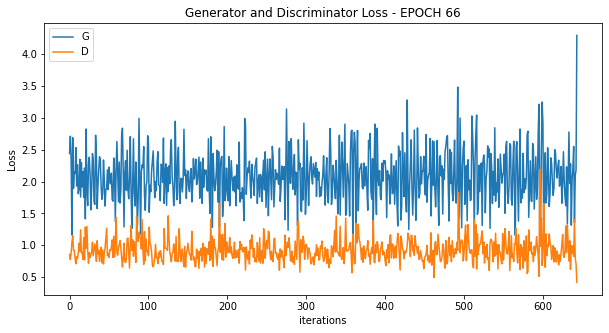

[68/100][322/644] Loss_D: 0.9197 Loss_G: 2.2895 D(x): 0.7903 D(G(z)): 0.3719 / 0.1013
[68/100][644/644] Loss_D: 1.7683 Loss_G: 2.9068 D(x): 0.1874 D(G(z)): 0.1617 / 0.1018



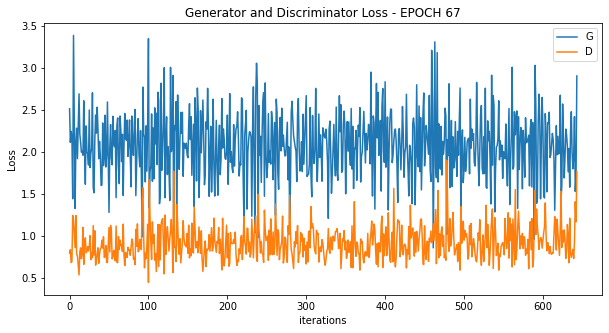

[69/100][322/644] Loss_D: 0.9918 Loss_G: 1.4764 D(x): 0.5148 D(G(z)): 0.1951 / 0.2343
[69/100][644/644] Loss_D: 1.0190 Loss_G: 9.2275 D(x): 0.7845 D(G(z)): 0.4482 / 0.0001



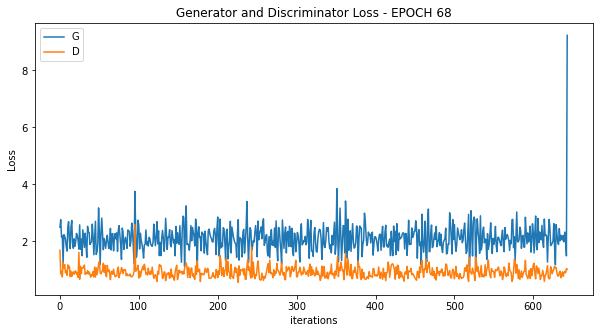

[70/100][322/644] Loss_D: 0.7903 Loss_G: 2.1479 D(x): 0.7656 D(G(z)): 0.2687 / 0.1140
[70/100][644/644] Loss_D: 0.7418 Loss_G: 2.3419 D(x): 0.5089 D(G(z)): 0.0101 / 0.0891



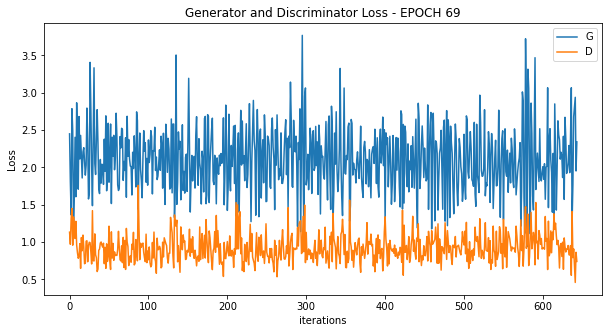

[71/100][322/644] Loss_D: 0.9025 Loss_G: 2.2084 D(x): 0.8289 D(G(z)): 0.3533 / 0.1185
[71/100][644/644] Loss_D: 0.4959 Loss_G: 3.3604 D(x): 0.6989 D(G(z)): 0.0502 / 0.0243



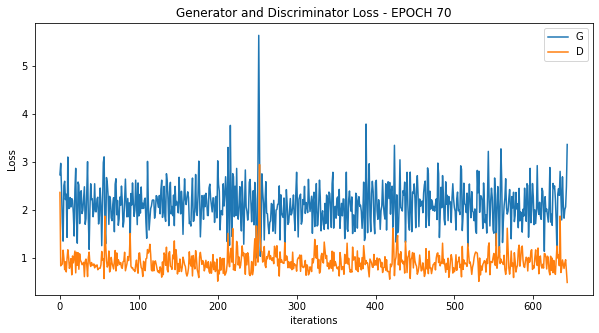

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


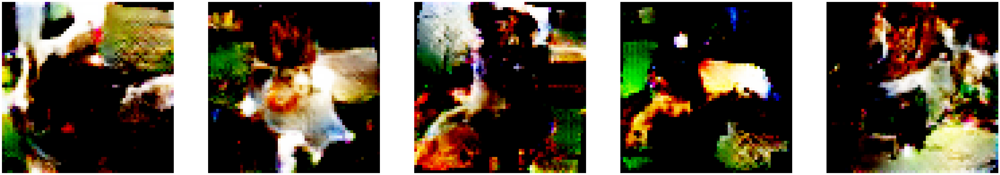

[72/100][322/644] Loss_D: 1.1433 Loss_G: 3.3779 D(x): 0.8284 D(G(z)): 0.4460 / 0.0314
[72/100][644/644] Loss_D: 2.5653 Loss_G: 3.6533 D(x): 0.1232 D(G(z)): 0.3333 / 0.0572



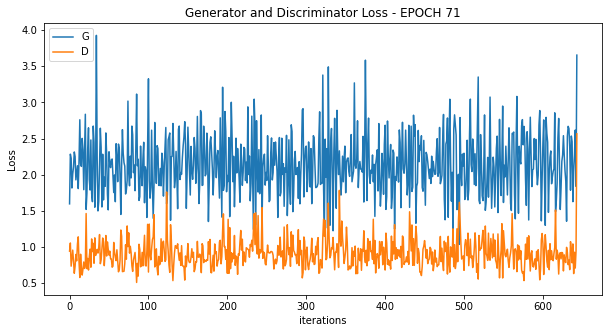

[73/100][322/644] Loss_D: 0.4879 Loss_G: 3.5507 D(x): 0.8447 D(G(z)): 0.0914 / 0.0354
[73/100][644/644] Loss_D: 1.3033 Loss_G: 2.8850 D(x): 0.2911 D(G(z)): 0.0935 / 0.1769



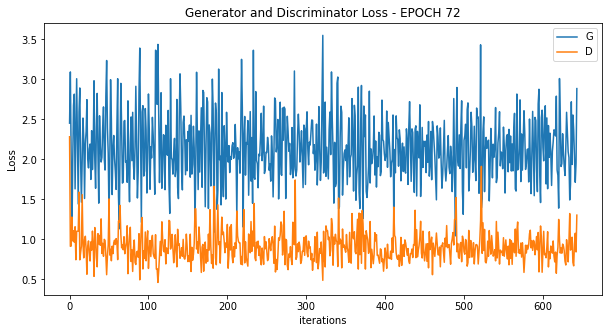

[74/100][322/644] Loss_D: 0.5957 Loss_G: 2.5235 D(x): 0.8112 D(G(z)): 0.1324 / 0.0855
[74/100][644/644] Loss_D: 1.6281 Loss_G: 4.3478 D(x): 0.2823 D(G(z)): 0.1513 / 0.0469



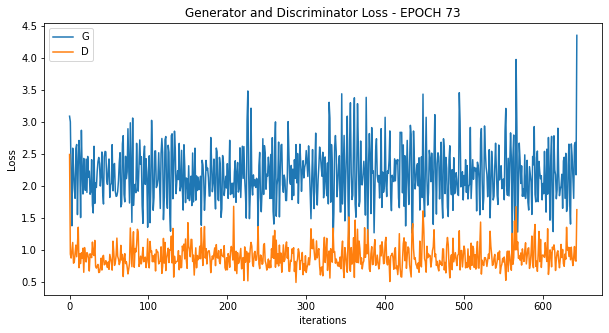

[75/100][322/644] Loss_D: 0.8756 Loss_G: 2.1598 D(x): 0.5468 D(G(z)): 0.1183 / 0.1374
[75/100][644/644] Loss_D: 0.6748 Loss_G: 3.5413 D(x): 0.6340 D(G(z)): 0.0218 / 0.0199



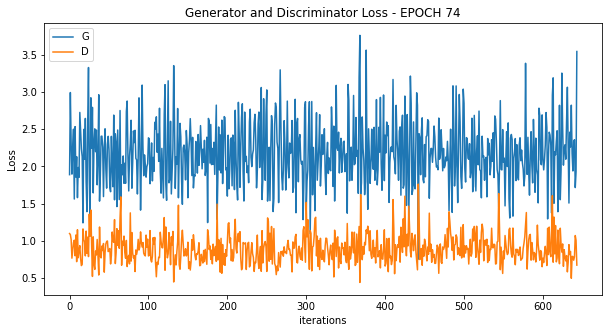

[76/100][322/644] Loss_D: 0.8386 Loss_G: 2.6450 D(x): 0.7464 D(G(z)): 0.2834 / 0.0755
[76/100][644/644] Loss_D: 1.3406 Loss_G: 2.0490 D(x): 0.2985 D(G(z)): 0.0797 / 0.1074



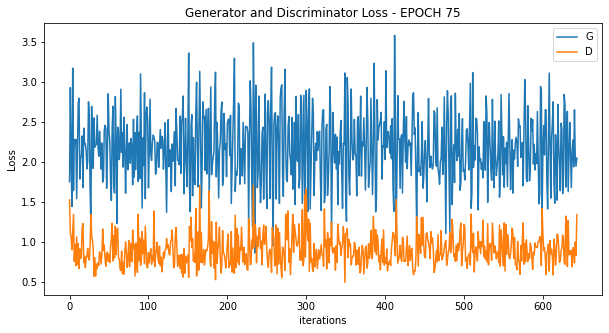

[77/100][322/644] Loss_D: 0.6321 Loss_G: 2.3319 D(x): 0.7094 D(G(z)): 0.1225 / 0.1223
[77/100][644/644] Loss_D: 0.6804 Loss_G: 4.4978 D(x): 0.5465 D(G(z)): 0.0047 / 0.0071



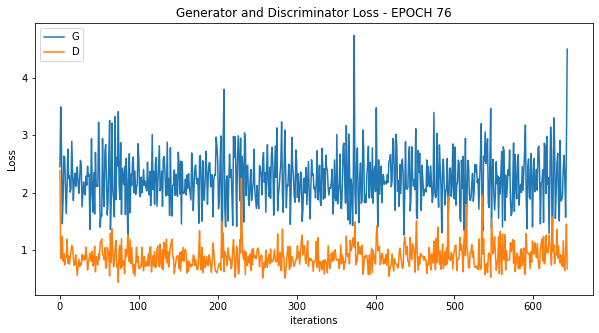

[78/100][322/644] Loss_D: 0.6632 Loss_G: 1.9620 D(x): 0.7025 D(G(z)): 0.1509 / 0.1636
[78/100][644/644] Loss_D: 1.7488 Loss_G: 8.7830 D(x): 0.5153 D(G(z)): 0.4300 / 0.0035



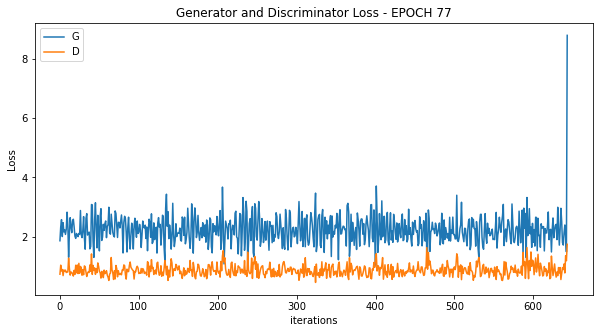

[79/100][322/644] Loss_D: 0.9734 Loss_G: 2.5079 D(x): 0.7954 D(G(z)): 0.3599 / 0.0866
[79/100][644/644] Loss_D: 0.9199 Loss_G: 3.3387 D(x): 0.5120 D(G(z)): 0.1305 / 0.0364



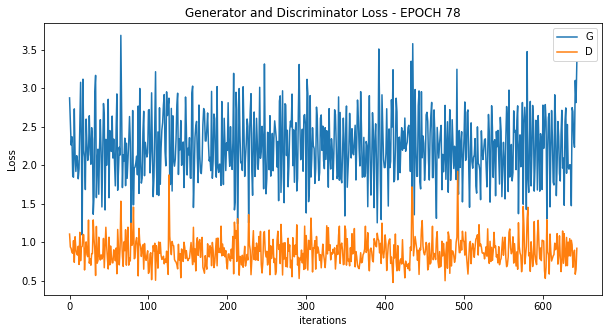

[80/100][322/644] Loss_D: 0.7102 Loss_G: 2.2071 D(x): 0.7793 D(G(z)): 0.2223 / 0.1144
[80/100][644/644] Loss_D: 1.3670 Loss_G: 1.8515 D(x): 0.2556 D(G(z)): 0.0347 / 0.1419



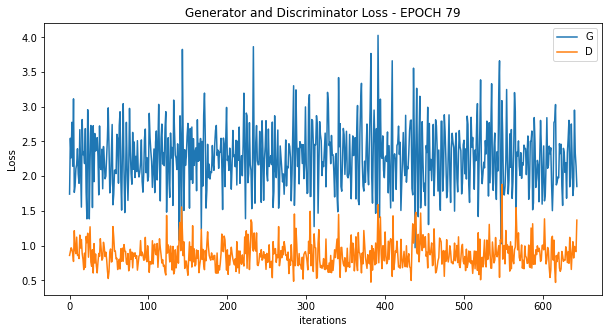

[81/100][322/644] Loss_D: 1.0234 Loss_G: 1.2660 D(x): 0.4711 D(G(z)): 0.1564 / 0.3034
[81/100][644/644] Loss_D: 0.5287 Loss_G: 3.8856 D(x): 0.7544 D(G(z)): 0.1021 / 0.0146



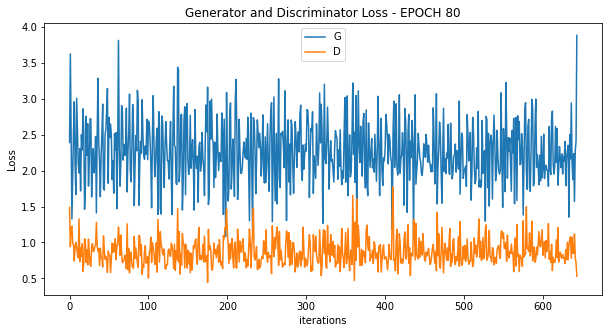

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


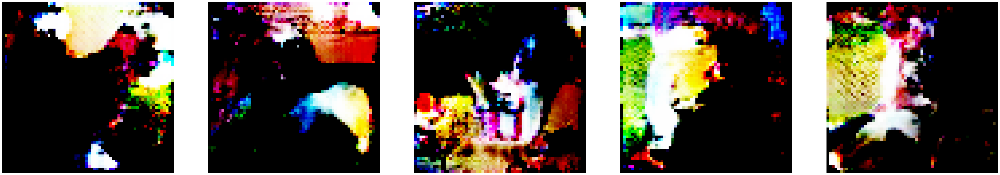

[82/100][322/644] Loss_D: 1.0165 Loss_G: 2.2006 D(x): 0.7510 D(G(z)): 0.3648 / 0.1116
[82/100][644/644] Loss_D: 2.3499 Loss_G: 2.4724 D(x): 0.1152 D(G(z)): 0.0987 / 0.0782



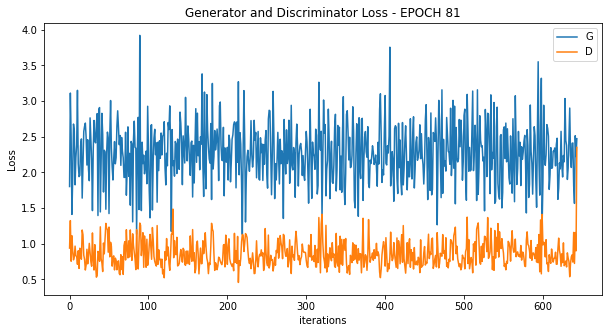

[83/100][322/644] Loss_D: 0.7667 Loss_G: 2.2872 D(x): 0.6426 D(G(z)): 0.1495 / 0.0964
[83/100][644/644] Loss_D: 1.5607 Loss_G: 12.5964 D(x): 0.9939 D(G(z)): 0.5811 / 0.0000



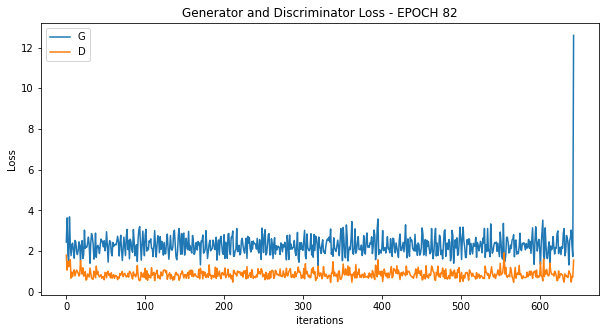

[84/100][322/644] Loss_D: 1.2359 Loss_G: 2.5596 D(x): 0.8260 D(G(z)): 0.4648 / 0.0779
[84/100][644/644] Loss_D: 1.1798 Loss_G: 2.3730 D(x): 0.3127 D(G(z)): 0.0124 / 0.0731



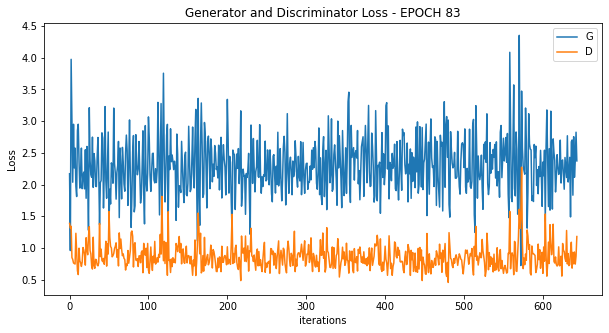

[85/100][322/644] Loss_D: 1.0283 Loss_G: 1.8907 D(x): 0.5930 D(G(z)): 0.2761 / 0.1730
[85/100][644/644] Loss_D: 1.8729 Loss_G: 5.5607 D(x): 0.2147 D(G(z)): 0.2203 / 0.0096



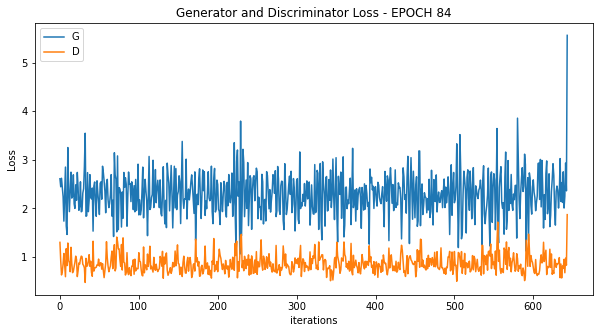

[86/100][322/644] Loss_D: 0.5654 Loss_G: 3.0093 D(x): 0.8105 D(G(z)): 0.1187 / 0.0493
[86/100][644/644] Loss_D: 0.5700 Loss_G: 4.5287 D(x): 0.7288 D(G(z)): 0.1222 / 0.0066



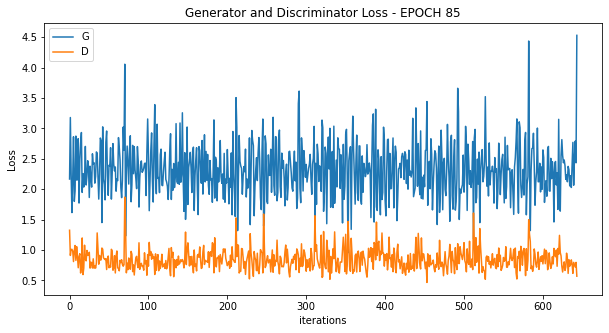

[87/100][322/644] Loss_D: 0.8904 Loss_G: 2.3943 D(x): 0.8066 D(G(z)): 0.3215 / 0.0893
[87/100][644/644] Loss_D: 3.2256 Loss_G: 4.3336 D(x): 0.0504 D(G(z)): 0.2203 / 0.0092



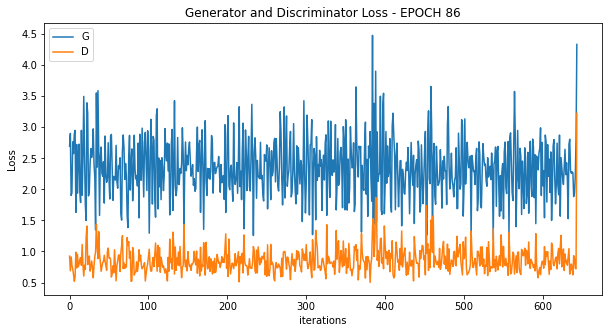

[88/100][322/644] Loss_D: 0.8093 Loss_G: 2.4138 D(x): 0.8006 D(G(z)): 0.2651 / 0.1101
[88/100][644/644] Loss_D: 1.0608 Loss_G: 2.5808 D(x): 0.3837 D(G(z)): 0.0456 / 0.0576



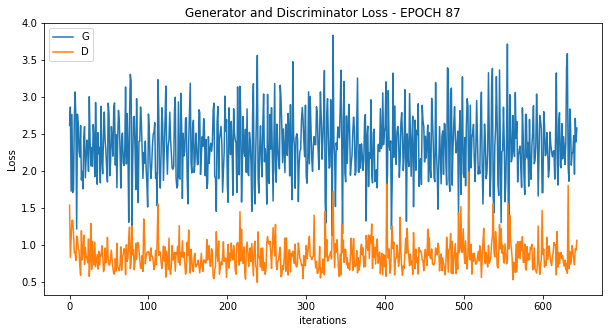

[89/100][322/644] Loss_D: 0.9315 Loss_G: 2.3894 D(x): 0.8476 D(G(z)): 0.3685 / 0.0962
[89/100][644/644] Loss_D: 0.5042 Loss_G: 4.7438 D(x): 0.9627 D(G(z)): 0.0785 / 0.0055



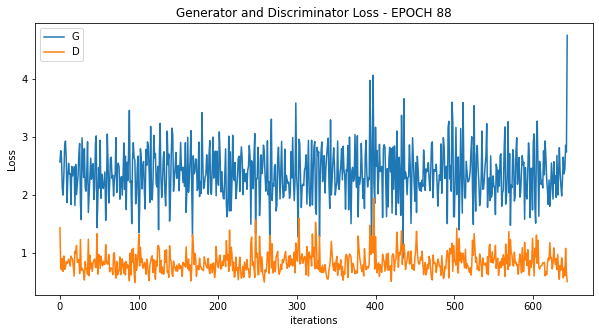

[90/100][322/644] Loss_D: 0.8993 Loss_G: 1.7251 D(x): 0.5287 D(G(z)): 0.1116 / 0.2015
[90/100][644/644] Loss_D: 1.3765 Loss_G: 1.2460 D(x): 0.3729 D(G(z)): 0.0549 / 0.2659



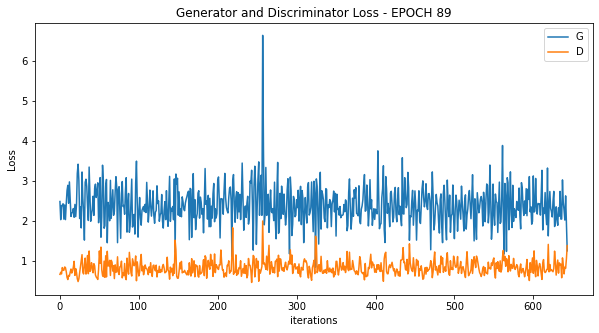

[91/100][322/644] Loss_D: 0.7292 Loss_G: 2.2417 D(x): 0.8861 D(G(z)): 0.2651 / 0.1116
[91/100][644/644] Loss_D: 1.2114 Loss_G: 2.3323 D(x): 0.3692 D(G(z)): 0.0166 / 0.0830



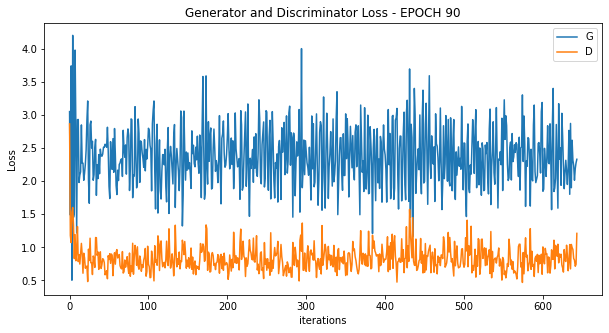

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


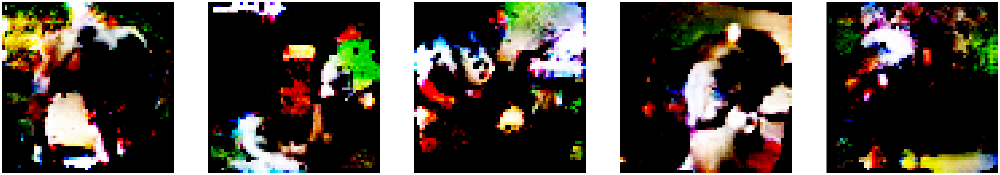

[92/100][322/644] Loss_D: 0.7962 Loss_G: 1.7927 D(x): 0.6911 D(G(z)): 0.1938 / 0.1696
[92/100][644/644] Loss_D: 1.3589 Loss_G: 1.5329 D(x): 0.3422 D(G(z)): 0.0257 / 0.2151



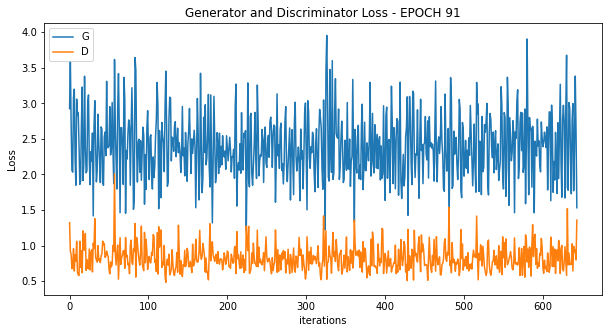

[93/100][322/644] Loss_D: 0.6605 Loss_G: 3.1262 D(x): 0.9590 D(G(z)): 0.2080 / 0.0472
[93/100][644/644] Loss_D: 1.6771 Loss_G: 1.2124 D(x): 0.2511 D(G(z)): 0.0549 / 0.2822



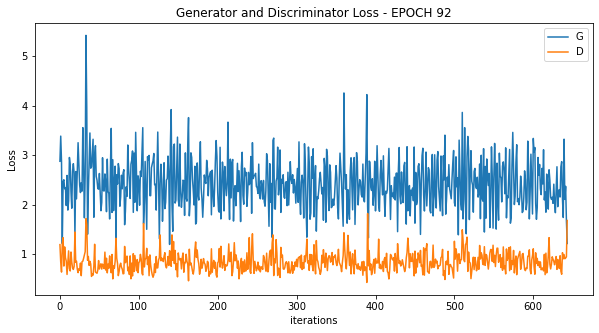

[94/100][322/644] Loss_D: 1.0308 Loss_G: 1.7557 D(x): 0.5373 D(G(z)): 0.1975 / 0.1992
[94/100][644/644] Loss_D: 1.6696 Loss_G: 1.6527 D(x): 0.1957 D(G(z)): 0.0837 / 0.1814



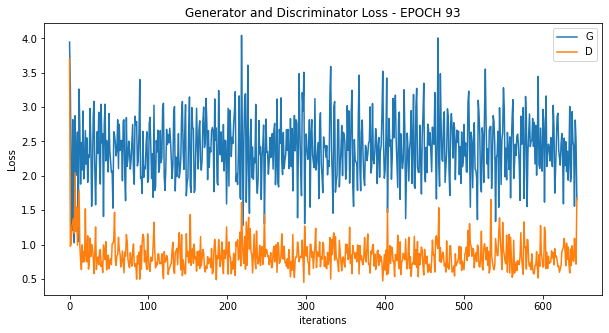

[95/100][322/644] Loss_D: 0.7983 Loss_G: 2.1770 D(x): 0.5813 D(G(z)): 0.0943 / 0.1418
[95/100][644/644] Loss_D: 0.4306 Loss_G: 4.5927 D(x): 0.7794 D(G(z)): 0.0517 / 0.0075



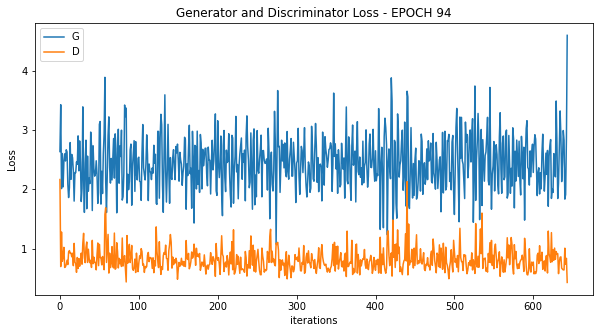

[96/100][322/644] Loss_D: 0.6075 Loss_G: 2.9622 D(x): 0.7734 D(G(z)): 0.1436 / 0.0483
[96/100][644/644] Loss_D: 0.5095 Loss_G: 3.9365 D(x): 0.7131 D(G(z)): 0.0414 / 0.0129



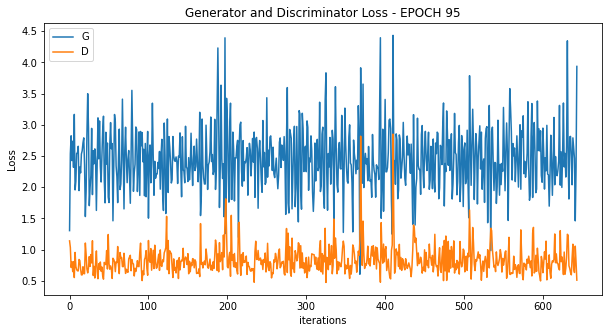

[97/100][322/644] Loss_D: 0.7850 Loss_G: 2.7772 D(x): 0.7841 D(G(z)): 0.2789 / 0.0619
[97/100][644/644] Loss_D: 1.0133 Loss_G: 1.2764 D(x): 0.3713 D(G(z)): 0.0544 / 0.2515



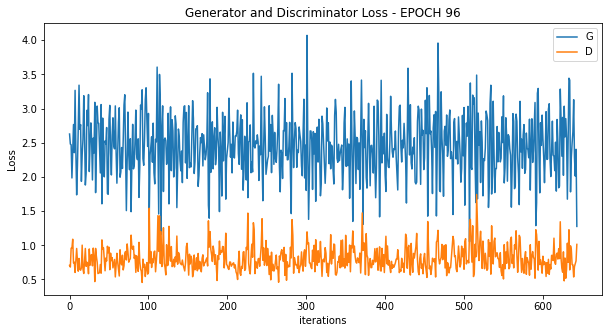

[98/100][322/644] Loss_D: 0.9960 Loss_G: 1.8559 D(x): 0.5530 D(G(z)): 0.1753 / 0.1694
[98/100][644/644] Loss_D: 0.5072 Loss_G: 5.1445 D(x): 0.8549 D(G(z)): 0.1080 / 0.0038



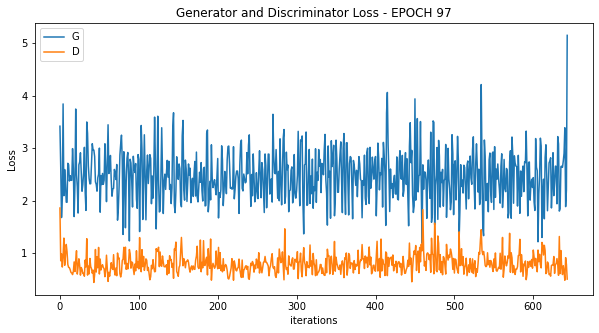

[99/100][322/644] Loss_D: 0.7466 Loss_G: 2.2035 D(x): 0.7798 D(G(z)): 0.2542 / 0.1015
[99/100][644/644] Loss_D: 1.6483 Loss_G: 3.4514 D(x): 0.3473 D(G(z)): 0.1828 / 0.0284



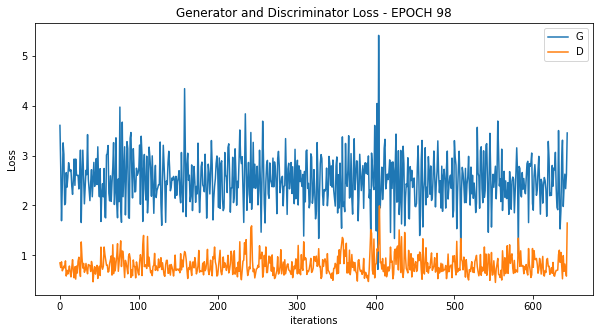

[100/100][322/644] Loss_D: 0.6483 Loss_G: 2.3436 D(x): 0.6857 D(G(z)): 0.1132 / 0.1131
[100/100][644/644] Loss_D: 0.4295 Loss_G: 4.2452 D(x): 0.8647 D(G(z)): 0.0693 / 0.0095



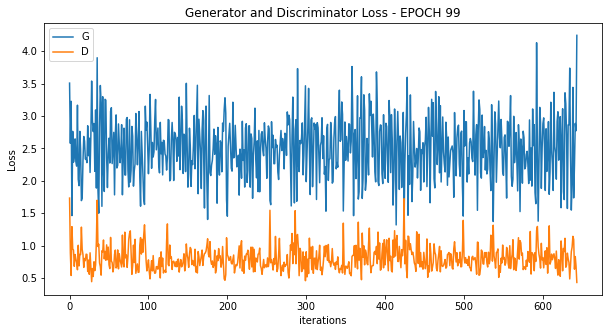

In [45]:
for epoch in range(epochs):
    
    start = time.time()
    for ii, (real_images, train_labels) in tqdm(enumerate(train_loader), total=len(train_loader)):
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        # train with real
        netD.zero_grad()
        real_images = real_images.to(device)
        batch_size = real_images.size(0)
        labels = torch.full((batch_size, 1), real_label, device=device)

        output = netD(real_images)
        errD_real = criterion(output, labels)
        errD_real.backward()
        D_x = output.mean().item()

        # train with fake
        noise = torch.randn(batch_size, nz, 1, 1, device=device)
        fake = netG(noise)
        labels.fill_(fake_label)
        output = netD(fake.detach())
        errD_fake = criterion(output, labels)
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        errD = errD_real + errD_fake
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        labels.fill_(real_label)  # fake labels are real for generator cost
        output = netD(fake)
        errG = criterion(output, labels)
        errG.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()
        
        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())
        
        if (ii+1) % (len(train_loader)//2) == 0:
            print('[%d/%d][%d/%d] Loss_D: %.4f Loss_G: %.4f D(x): %.4f D(G(z)): %.4f / %.4f'
                  % (epoch + 1, epochs, ii+1, len(train_loader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
            
    plot_loss (G_losses, D_losses, epoch)
    G_losses = []
    D_losses = []
    if epoch % 10 == 0:
        show_generated_img()

    epoch_time.append(time.time()- start)
    
#             valid_image = netG(fixed_noise)